# Ужасы линейной регрессии

In [119]:
import numpy as np
import pandas as pd
import time
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import (
    HuberRegressor,
    LinearRegression,
    RANSACRegressor,
    TheilSenRegressor,
)
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
np.random.seed(42)

# Разминка
1) Какие признаки может обработать линейная регрессия?
Как числовые так и категориальные (обработанные через encoder-ы). Между признаками и целевой переменной должна существовать линейная зависимость.
2) Почему нет понятия полиномиальных моделей?
Т.к такая модель все еще является линейной относительно коэффициентов. Т.е это просто пример представления линейной модели.
3) Вам дан набор данных из 8 элементов. Вы используете стохастический градиентный спуск с батчем 8. Сколько шагов нужно сделать, чтобы пройти весь набор данных?
1
4) Вам нужно предсказать, к какой категории относится товар. Всего категорий 100. Как лучше решать такую задачу - через регрессию или классификацию?
Я бы сказал, что если это задача классификации, то важно применить нужный encoder, думаю можно попробывать и так и так решить. И через логистическую регрессию и через классификацию.
5) Вам нужно предсказать, в каком часу была сделана покупка некоторого товара. Вы решили использовать для этого регрессию. Расскажите, как вы будете решать эту задачу. Как вы сформируете таргет? Как будете выдавать предсказания на инференсе?
Таргет: вещестенное число которое обозначает часы и минуты покупки. 14,5 -> 14:30 (с округлением)
Общий план действий:  посмотрю какие параметры не влияют на результат через t-test, попробую доказать нормальность распределения, в зависимотси от вида распределения буду думать над параметрами, попробую сначало просто линейную регрессию, потом квантильную, а дальше запущу pipeline по нескольким моделям линейной регрессии, посмотрев какие лучше всего справляются, добавлю гиперпараметризацию. Отоброжу наилучший результат на графиках. 
Инференс: Модель будет выдавать число которое будет обозначать примерное время покупки на основе входных параметров. Можно просто округлить до часа или взять дробную часть как было сделанно в таргете.
6) Как выглядит точное решение задачи линейной регрессии (нормальная форма)?
w = (X^T * X)^(-1) * X^T * y (выводили на паре)

# База
Напомню, что линейная регрессия - это модель следующего вида:
    $$a(x) = \langle w, x \rangle + w_0$$,
    где $w \in \mathbb{R}^d$, $w_0 \in \mathbb{R}$. 
Обучить линейную регрессию - значит найти $w$ и $w_0$., минимизирующие разницу между предсказанными значениями  $y'$ и  $y$.

# Ловушки в данных

Рассмотрим набор данных, состоящий из 2 разных предикторов и четырех таргетов. Этот набор специально создан, чтобы показать важность анализа данных даже в, казалось бы, простой ситуации. Построим 4 разные модели по парам (x123, y1), (x123, y2),(x123, y3), (x4, y4).

In [112]:
data_path = "/Users/yuki/Documents/GitHub/spbu_ml_2025/data"

In [113]:
quartet_df = pd.read_csv(f"{data_path}/Anscombe_quartet_data.csv")

In [36]:
quartet_df.head(5)

,x123,y1,y2,y3,x4,y4
0,10.0,8.04,9.14,7.46,8.0,6.58
1,8.0,6.95,8.14,6.77,8.0,5.76
2,13.0,7.58,8.74,12.74,8.0,7.71
3,9.0,8.81,8.77,7.11,8.0,8.84
4,11.0,8.33,9.26,7.81,8.0,8.47


Для начала рассмотрим значения корреляций между признаками и таргетами

In [37]:
def corrplot(d: pd.DataFrame) -> None:
  corr = d.corr()
  mask = np.triu(np.ones_like(corr, dtype=bool))
  figsize = (min(d.shape[1], 11), min(d.shape[1], 9))
  f, ax = plt.subplots(figsize=figsize)
  cmap = sns.diverging_palette(230, 20, as_cmap=True)
  sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
              square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

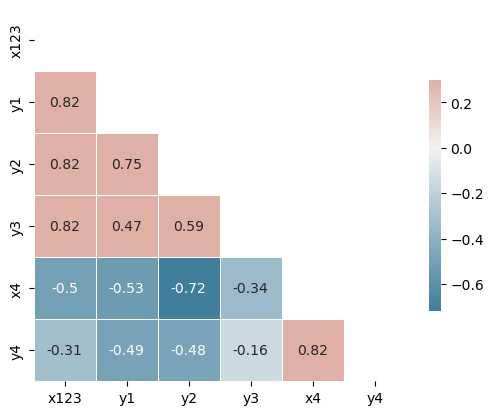

In [38]:
corrplot(quartet_df)

Как видно, корреляции одинаковы. Однако, если построить модели и графики предсказаний, результаты будут знгачительно отличаться.
ЭТакже выведем значения коэффициентов модели.

**Задание**: Постройте линейные модели для каждого из наборов данных, не смотря на графики. Отличаются ли модели?

In [39]:
# Anscombe 1
x = np.array(quartet_df['x123']).reshape((-1, 1))
y = np.array(quartet_df['y1'])
model_1 = LinearRegression().fit(x, y)
y_pred = model_1.predict(x)
r_sq = model_1.score(x, y)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {model_1.intercept_}")
print(f"slope: {model_1.coef_}")


coefficient of determination: 0.666542459508775
intercept: 3.0000909090909103
slope: [0.50009091]


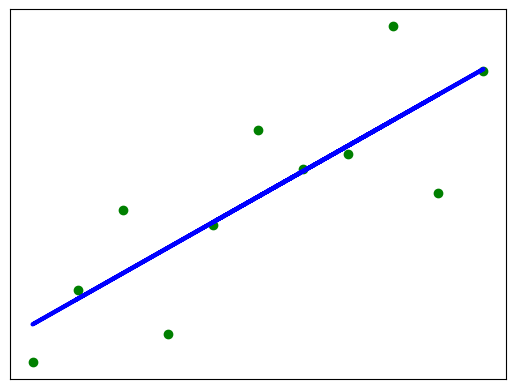

In [40]:
plt.scatter(x, y, color="green")
plt.plot(x, y_pred, color="blue", linewidth=3)
plt.xticks(())
plt.yticks(())
plt.show()

In [41]:
# Anscombe 2
x = np.array(quartet_df['x123']).reshape((-1, 1))
y = np.array(quartet_df['y2'])
model_1 = LinearRegression().fit(x, y)
y_pred = model_1.predict(x)
r_sq = model_1.score(x, y)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {model_1.intercept_}")
print(f"slope: {model_1.coef_}")

coefficient of determination: 0.6662420337274844
intercept: 3.000909090909089
slope: [0.5]


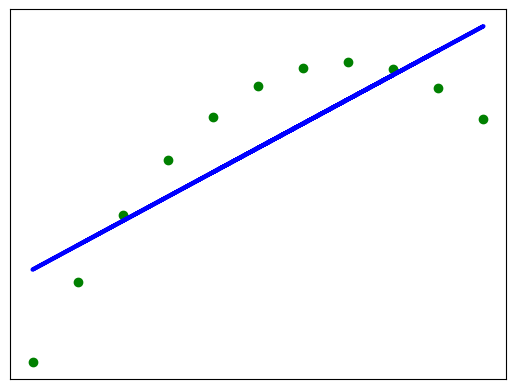

In [42]:
plt.scatter(x, y, color="green")
plt.plot(x, y_pred, color="blue", linewidth=3)
plt.xticks(())
plt.yticks(())
plt.show()

In [43]:
# Anscombe 3
x = np.array(quartet_df['x123']).reshape((-1, 1))
y = np.array(quartet_df['y3'])
model_1 = LinearRegression().fit(x, y)
y_pred = model_1.predict(x)
r_sq = model_1.score(x, y)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {model_1.intercept_}")
print(f"slope: {model_1.coef_}")

coefficient of determination: 0.6663240410665592
intercept: 3.002454545454545
slope: [0.49972727]


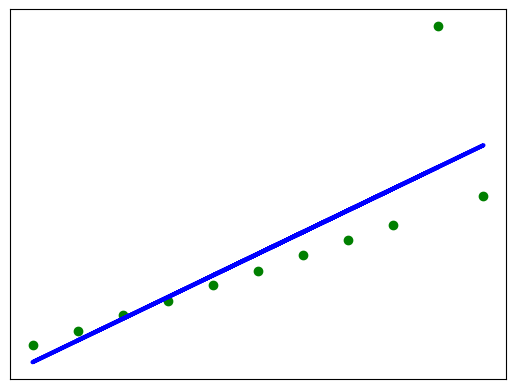

In [44]:
plt.scatter(x, y, color="green")
plt.plot(x, y_pred, color="blue", linewidth=3)
plt.xticks(())
plt.yticks(())
plt.show()

In [45]:
# Anscombe 4
x = np.array(quartet_df['x4']).reshape((-1, 1))
y = np.array(quartet_df['y4'])
model_1 = LinearRegression().fit(x, y)
y_pred = model_1.predict(x)
r_sq = model_1.score(x, y)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {model_1.intercept_}")
print(f"slope: {model_1.coef_}")

coefficient of determination: 0.6667072568984653
intercept: 3.0017272727272726
slope: [0.49990909]


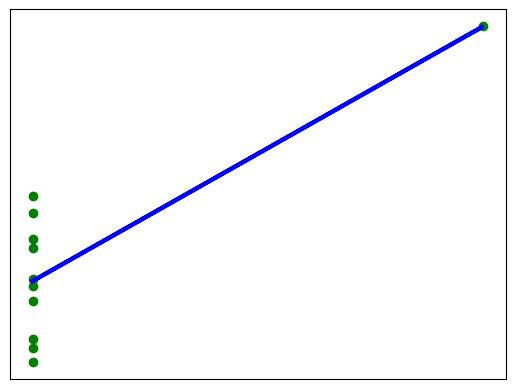

In [46]:
plt.scatter(x, y, color="green")
plt.plot(x, y_pred, color="blue", linewidth=3)
plt.xticks(())
plt.yticks(())
plt.show()

Как видно, все эти зависимости имеют разную природу, но при этом порождают модели с практически одинаковыми параметрами. Таким образом, чрезвычайно важно проводить достаточно объемный EDA.
Датасте же - известный набор [Anscombe's quartet](https://en.wikipedia.org/wiki/Anscombe%27s_quartet)

# Положения линейной регрессии
Далее рассмотрим некоторые положения линейной регрессии, которые задают границы ее применимости (а также что бывает, когда они нарушаются).

**Линейность**: взаимосвязь между зависимыми и независимыми переменными линейна.

**Независимость**: Наблюдения независимы друг от друга.

**Гомоскедастичность**: дисперсия ошибок постоянна на всех уровнях независимых переменных.

**Нормальность**: ошибки подчиняются нормальному распределению.

**Нет мультиколлинеарности**: независимые переменные не сильно коррелируют друг с другом.

**Нет эндогенности**: между ошибками и независимыми переменными нет связи.

## Нелинейность

Рассмотрим набор данных Bluegills.
В 1981 году n = 78 [cинежаберных солнечников](https://ru.wikipedia.org/wiki/%D0%A1%D0%B8%D0%BD%D0%B5%D0%B6%D0%B0%D0%B1%D0%B5%D1%80%D0%BD%D1%8B%D0%B9_%D1%81%D0%BE%D0%BB%D0%BD%D0%B5%D1%87%D0%BD%D0%B8%D0%BA) были случайным образом отобраны из озера Мэри в Миннесоте (Кук и Вайсберг, 1999):
* Длина (в мм) рыбы
* Возраст (в годах) рыбы


In [47]:
df = pd.read_csv(f"{data_path}/bluegills.txt", sep="\t")

In [48]:
df.head(5)

,age,length
0,1,67
1,1,62
2,2,109
3,2,83
4,2,91


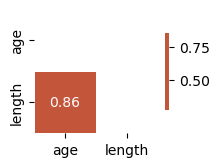

In [49]:
corrplot(df)

Постройте график длины рыбы от возраста 

coefficient of determination: 0.7348821471782518
intercept: 62.64898354307847
slope: [22.31229429]


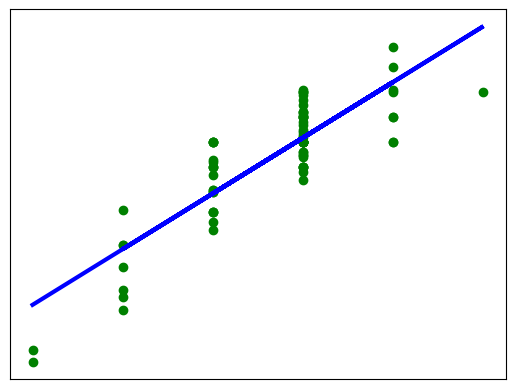

In [50]:
# your code - do as for ans1 -
x = np.array(df['age']).reshape(-1,1)
y = np.array(df['length'])
model_1 = LinearRegression().fit(x, y)
y_pred = model_1.predict(x)
r_sq = model_1.score(x, y)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {model_1.intercept_}")
print(f"slope: {model_1.coef_}") 
plt.scatter(x, y, color="green")
plt.plot(x, y_pred, color="blue", linewidth=3)
plt.xticks(())
plt.yticks(())
plt.show()

График позволяет предположить, что в данных наблюдается положительная динамика. Неудивительно, что с увеличением возраста рыб их длина имеет тенденцию к увеличению. Однако эта тенденция не выглядит вполне линейной. Кажется, что отношения слегка искривлены.

Один из способов моделирования кривизны этих данных — сформулировать «полиномиальную модель второго порядка»:

$ Y=\beta_0+ \sum_i (\alpha_i  X_i^2) + \sum_i (\beta_i  X_i) + \sum_{j \neq i} (\gamma_{ij}  X_i X_j) + \epsilon $

Сделать это просто, введя в данные полиномиальные признаки (PolynomialFeatures) и обучив обычную линейную модель.

**Задание**: Обучите обычную и полиномиальную регрессии на рыбах. Постройте графики предсказаний. 
**Доп.задание**: Определите MSE для двух моделей.

In [51]:
X = np.array(df['age']).reshape(-1,1)
y = np.array(df['length'])
model_basic =  LinearRegression().fit(X, y)
y_basic = model_basic.predict(X)

In [52]:
degree = 2  # Set the polynomial degree
poly_features =  PolynomialFeatures(degree=degree)
X_poly = poly_features.fit_transform(X)

model_poly = LinearRegression()
model_poly.fit(X_poly, y)
# fit model on processed data

y_poly = model_poly.predict(X_poly)

In [53]:
print(f"coefficient of determination of linear model: {model_basic.score(X, y)}")
print(f"coefficient of determination of polynomial model: {model_poly.score(X_poly, y)}")

coefficient of determination of linear model: 0.7348821471782518
coefficient of determination of polynomial model: 0.8011378030846004


In [54]:
# Для линейной модели
y_pred_basic = model_basic.predict(X)
mse_basic = mean_squared_error(y, y_basic)
print(f"Mean Squared Error of linear model: {mse_basic}")

# Для полиномиальной модели
mse_poly = mean_squared_error(y, y_poly)
print(f"Mean Squared Error of polynomial model: {mse_poly}")

Mean Squared Error of linear model: 152.47226648794907
Mean Squared Error of polynomial model: 114.36789171210626


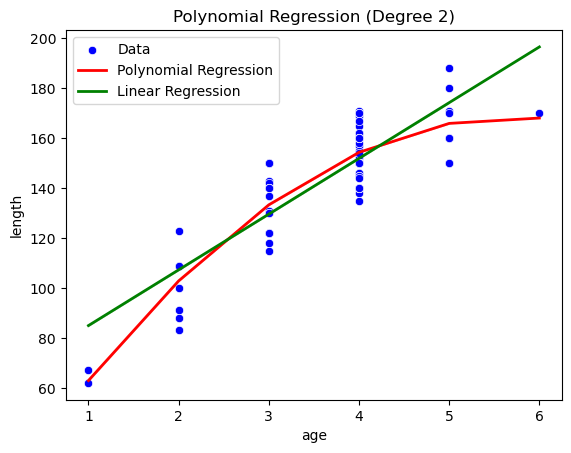

In [55]:
sns.scatterplot(df,x="age", y="length", label='Data', color='blue')
sns.lineplot(x=df["age"], y=y_poly, label='Polynomial Regression', color='red', linewidth=2)
sns.lineplot(x=df["age"], y=y_basic, label='Linear Regression', color='green', linewidth=2)
plt.xlabel('age')
plt.ylabel('length')
plt.legend()
plt.title(f'Polynomial Regression (Degree {degree})')
plt.show()

**Задание**: Постройте модель с фичами высокой степени.

coefficient of determination of linear model: 0.7348821471782518
coefficient of determination of polynomial model: 0.8035456293632379


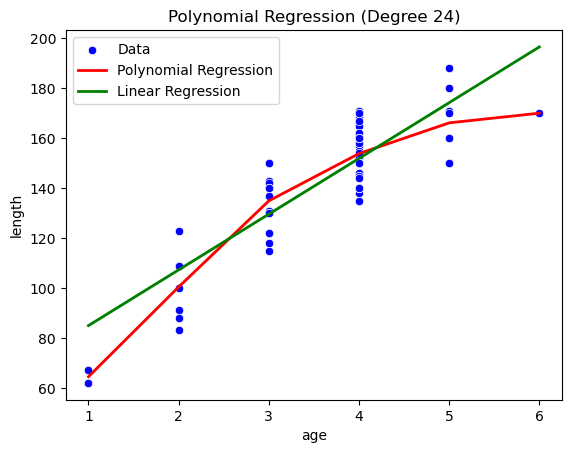

In [56]:
degree =  24  # Set the polynomial degree
poly_features =  PolynomialFeatures(degree=degree)
X_poly = poly_features.fit_transform(X)

model_poly = LinearRegression()
model_poly.fit(X_poly, y)
# fit model on processed data

y_poly = model_poly.predict(X_poly)
print(f"coefficient of determination of linear model: {model_basic.score(X, y)}")
print(f"coefficient of determination of polynomial model: {model_poly.score(X_poly, y)}")
sns.scatterplot(df,x="age", y="length", label='Data', color='blue')
sns.lineplot(x=df["age"], y=y_poly, label='Polynomial Regression', color='red', linewidth=2)
sns.lineplot(x=df["age"], y=y_basic, label='Linear Regression', color='green', linewidth=2)
plt.xlabel('age')
plt.ylabel('length')
plt.legend()
plt.title(f'Polynomial Regression (Degree {degree})')
plt.show()


**Задание**: Постройте модель для наборов Anscombe 1 и Anscombe 2. Напишите, какие степени полинома подойдут лучше всего.

**Задание со звездочкой**: Постройте модель с использованием другого базиса, не полиномиального. Проиллюстрируйте ее применение на примерах из практики.


# Anscombe 1
Лучшая степень полинома: 2
Лучшая степень полинома для функции sigmoid: 9
Лучшая степень полинома для функции sin4: 3
Лучшая степень полинома для функции fourier: 8
R^2 для полиномиальной модели: 0.6873
R^2 для функции sigmoid: 0.4880
R^2 для функции sin4: 0.7503
R^2 для функции fourier: 1.0000


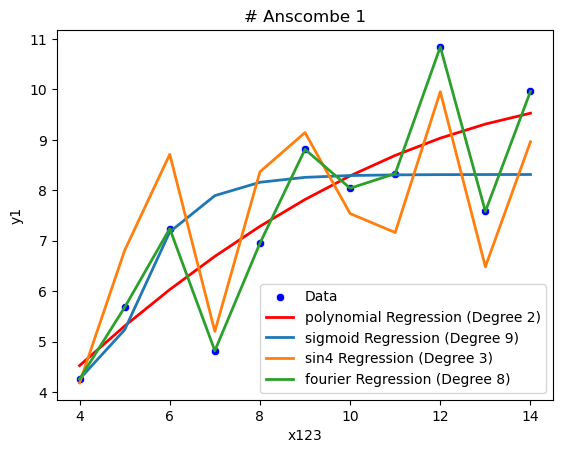

# Anscombe 2
Лучшая степень полинома: 2
Лучшая степень полинома для функции sigmoid: 9
Лучшая степень полинома для функции sin4: 6
Лучшая степень полинома для функции fourier: 9
R^2 для полиномиальной модели: 1.0000
R^2 для функции sigmoid: 0.9277
R^2 для функции sin4: 0.8407
R^2 для функции fourier: 1.0000


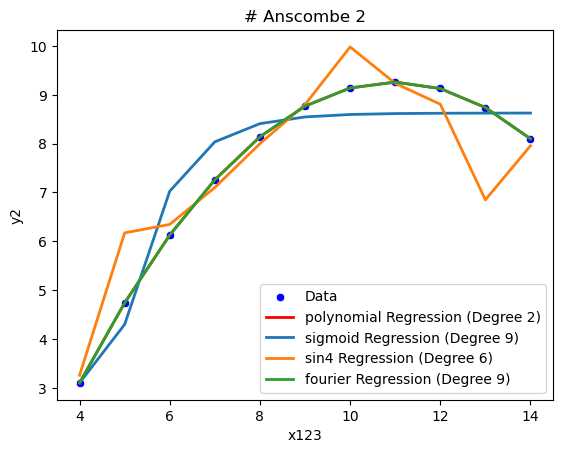

# Anscombe 3
Лучшая степень полинома: 2
Лучшая степень полинома для функции sigmoid: 2
Лучшая степень полинома для функции sin4: 2
Лучшая степень полинома для функции fourier: 10
R^2 для полиномиальной модели: 0.6847
R^2 для функции sigmoid: 0.3310
R^2 для функции sin4: 0.1868
R^2 для функции fourier: 1.0000


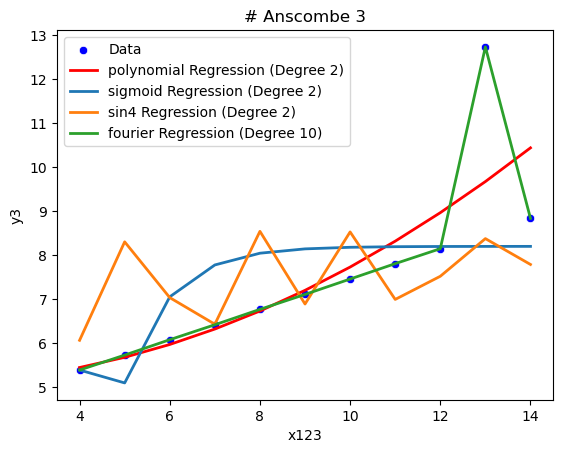

# Anscombe 4
Лучшая степень полинома: 2
Лучшая степень полинома для функции sigmoid: 9
Лучшая степень полинома для функции sin4: 2
Лучшая степень полинома для функции fourier: 7
R^2 для полиномиальной модели: 0.6667
R^2 для функции sigmoid: 0.6667
R^2 для функции sin4: 0.6667
R^2 для функции fourier: 0.6667


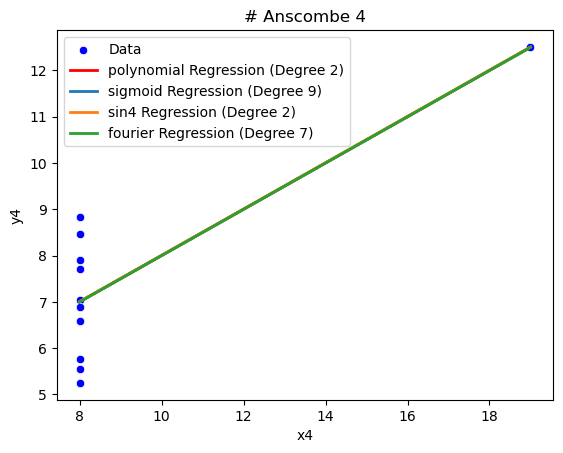

In [57]:

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sin4(x):
    return np.sin(4*x)

def fourier(x):
    return np.concatenate([np.sin(x), np.cos(x)], axis=1)


def plot_polynomial_regression(data, x_column, y_column, title_prefix, extra_functions=None):
    x = np.array(data[x_column]).reshape((-1, 1))
    y = np.array(data[y_column])

    degrees = range(2, 11)
    cv_scores_poly = []
    cv_scores_extra = {func.__name__: [] for func in (extra_functions or [])}

    # Включаем функции по умолчанию, если они не предоставлены
    if extra_functions is None:
        extra_functions = [sigmoid]

    # Оценка полиномиальной модели
    for degree in degrees:
        poly_features = PolynomialFeatures(degree=degree)
        X_poly = poly_features.fit_transform(x)

        model_poly = LinearRegression()
        scores_poly = cross_val_score(model_poly, X_poly, y, cv=5, scoring='r2')
        cv_scores_poly.append(np.mean(scores_poly))

        # Оценка для каждой дополнительной функции
        for func in extra_functions:
            X_func = func(X_poly)
            model_func = LinearRegression()
            scores_func = cross_val_score(model_func, X_func, y, cv=5, scoring='r2')
            cv_scores_extra[func.__name__].append(np.mean(scores_func))

    # Определяем наилучшую степень для полинома
    best_degree_poly = degrees[np.argmax(cv_scores_poly)]
    print(f"{title_prefix}")
    print(f"Лучшая степень полинома: {best_degree_poly}")

    # Определяем наилучшую степень для каждой дополнительной функции
    best_degrees_extra = {}
    for func in extra_functions:
        best_degree_func = degrees[np.argmax(cv_scores_extra[func.__name__])]
        best_degrees_extra[func.__name__] = best_degree_func
        print(f"Лучшая степень полинома для функции {func.__name__}: {best_degree_func}")

    # Построение модели с наилучшими степенями
    poly_features = PolynomialFeatures(degree=best_degree_poly)
    X_poly_best = poly_features.fit_transform(x)
    model_poly_best = LinearRegression()
    model_poly_best.fit(X_poly_best, y)
    y_poly = model_poly_best.predict(X_poly_best)
    r2_poly = model_poly_best.score(X_poly_best, y)  # r2 для полиномиальной модели
    print(f"R^2 для полиномиальной модели: {r2_poly:.4f}")

    # Построение моделей для каждой дополнительной функции
    models_func_best = {}
    y_func_best = {}
    r2_func_best = {}
    for func in extra_functions:
        best_degree_func = best_degrees_extra[func.__name__]
        poly_features_func = PolynomialFeatures(degree=best_degree_func)
        X_func_best = func(poly_features_func.fit_transform(x))
        model_func_best = LinearRegression()
        model_func_best.fit(X_func_best, y)
        y_func_best[func.__name__] = model_func_best.predict(X_func_best)
        models_func_best[func.__name__] = model_func_best
        r2_func_best[func.__name__] = model_func_best.score(X_func_best, y)  # r2 для каждой дополнительной функции
        print(f"R^2 для функции {func.__name__}: {r2_func_best[func.__name__]:.4f}")

    # Отображение результатов
    sns.scatterplot(data, x=x_column, y=y_column, label='Data', color='blue')
    sns.lineplot(x=data[x_column], y=y_poly, label=f'polynomial Regression (Degree {best_degree_poly})', color='red', linewidth=2)

    for func in extra_functions:
        sns.lineplot(x=data[x_column], y=y_func_best[func.__name__], label=f'{func.__name__} Regression (Degree {best_degrees_extra[func.__name__]})', linewidth=2)

    plt.xlabel(x_column)
    plt.ylabel(y_column)
    plt.legend()
    plt.title(f'{title_prefix}')
    plt.show()

# Пример использования
plot_polynomial_regression(quartet_df, 'x123', 'y1', '# Anscombe 1', extra_functions=[sigmoid, sin4, fourier])
plot_polynomial_regression(quartet_df, 'x123', 'y2', '# Anscombe 2', extra_functions=[sigmoid, sin4, fourier])
plot_polynomial_regression(quartet_df, 'x123', 'y3', '# Anscombe 3', extra_functions=[sigmoid, sin4, fourier])
plot_polynomial_regression(quartet_df, 'x4', 'y4', '# Anscombe 4', extra_functions=[sigmoid, sin4, fourier])

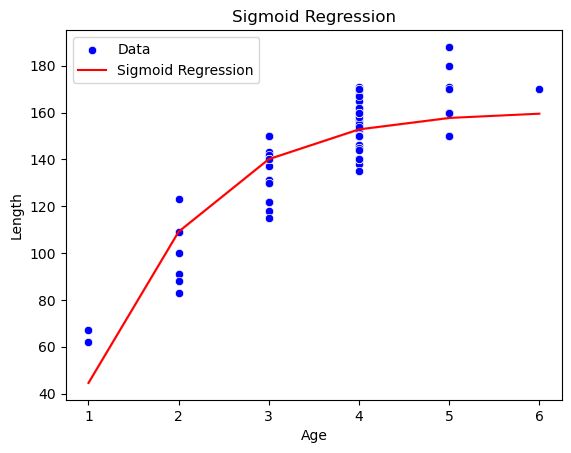

coefficient of determination: 0.7463033355667147
Mean Squared Error: 145.903812266401


In [58]:
x = np.array(df['age']).reshape(-1,1)
y = np.array(df['length'])

# Рассмотрим сигмоидальную функцию
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

X_sigmoid = sigmoid(x)

model = LinearRegression()
model.fit(X_sigmoid, y)

y_pred = model.predict(X_sigmoid)

sns.scatterplot(x=df['age'], y=df['length'], label='Data', color='blue')
sns.lineplot(x=df['age'], y=y_pred, label='Sigmoid Regression', color='red')
plt.xlabel('Age')
plt.ylabel('Length')
plt.title('Sigmoid Regression')
plt.legend()
plt.show()

# Вывод коэффициента детерминации и ошибки
print(f"coefficient of determination: {model.score(X_sigmoid, y)}")
print(f"Mean Squared Error: {mean_squared_error(y, y_pred)}")

## Выбросы
Как мы уже видели, выбросы могут сильно влиять на предсказания линейной модели. Даже один выброс может нарушить одно из условий линейной регрессии. К счастью, существует много способов с ними бороться.
Простейший вариант - использовать не MSE, а MAE. Почему?
Однако есть и более сложные варианты. Например, комбинация MSE и MAE дает **HuberLoss**.

Другой робастный вариант - **Theil-Sen regression**. Этот метод строит медиану наклона модели между всеми парами наблюдений. Проблема этого метода в том, что для больших наборов данных вычислительная сложность метода становится слишком большой.

Третий метод: **RANSAC**. В этом методе итеративно берутся подвыборки заданного размера, строятся модели и считаются расстояния от предсказания до реальной точки. Далее точки, для которых расстояние меньше некоторой границы, считаются доверенными. На этих данных обучается новая модель-кандидат. В качестве финальной используется лучший кандидат. Однако данный метод подходит только для моделей, которые не требуют очень большого количества данных.

Рассмотрим синтетические данные. Пусть это будут синусоидальные данные, но некоторые наблюдения будут "испорчены"

In [59]:
X = np.random.uniform(0, 1.5, size=1000)
y = np.sin(1.5 * np.pi * X) + np.random.normal(scale=0.1, size=X.shape)
X = X.reshape(-1,1)

X_test = np.random.uniform(0, 1.5, size=1000) 
y_test = np.sin(1.5 * np.pi * X_test) + np.random.normal(scale=0.1, size=X_test.shape)
X_test = X_test.reshape(-1,1)

y_errors = y.copy()
y_errors[::5] = 3

X_errors = X.copy()
X_errors[::5] = 3

y_errors_large = y.copy()
y_errors_large[::5] = 10

X_errors_large = X.copy()
X_errors_large[::5] = 10

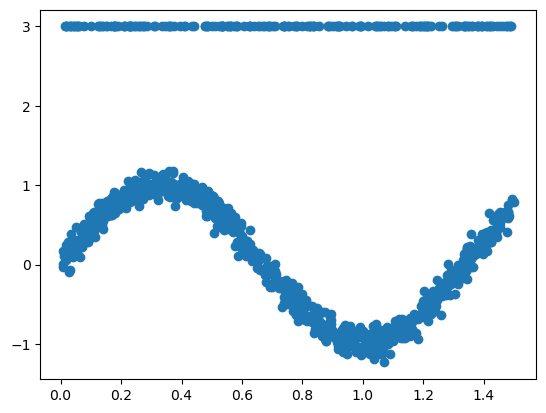

In [60]:
plt.scatter(X, y_errors)

**Задание**: Последовательно постройте различные модели для разных видов испорченности данных.

/var/folders/19/c1rn4t0n4qn2h0cjhj9f9_3r0000gn/T/ipykernel_86015/3943926609.py:47: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  errors_df = pd.concat([errors_df,pd.DataFrame.from_dict(data=errors_dict)])


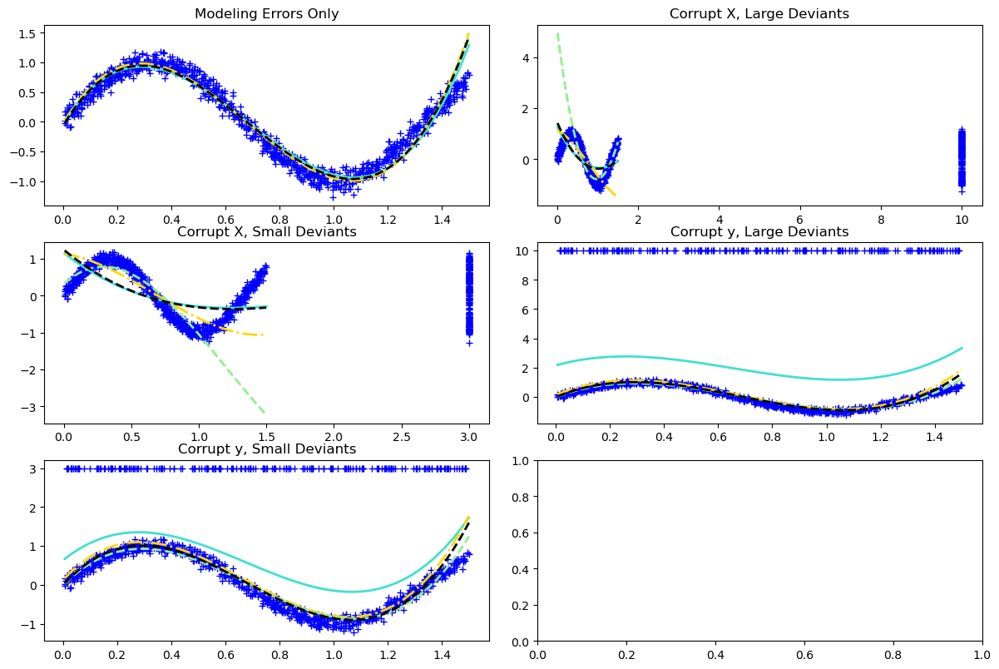

In [61]:
estimators = {
    "OLS": LinearRegression(),
    "Theil-Sen": TheilSenRegressor(random_state=42),
    "RANSAC": RANSACRegressor(random_state=42),
    "Huber": HuberRegressor(),
}

colors = {
    "OLS": "turquoise",
    "Theil-Sen": "gold",
    "RANSAC": "lightgreen",
    "Huber": "black",
}
linestyle = {"OLS": "-", "Theil-Sen": "-.", "RANSAC": "--", "Huber": "--"}
lw = 2
fig, ax = plt.subplots(nrows=3, ncols=2, figsize= (12,8))
fig.tight_layout()
x_plot = np.linspace(X.min(), X.max())
time_dict = {name: 0. for name in estimators.keys()}
errors_df = pd.DataFrame(columns = list(estimators.keys()))
time_dict["Problem"] = "Sum time"
for i, (title, this_X, this_y) in enumerate([
    ("Modeling Errors Only", X, y),
    ("Corrupt X, Small Deviants", X_errors, y),
    ("Corrupt y, Small Deviants", X, y_errors),
    ("Corrupt X, Large Deviants", X_errors_large, y),
    ("Corrupt y, Large Deviants", X, y_errors_large),
]):
    ax[i % 3, i // 3].plot(this_X[:, 0], this_y, "b+")
    errors_dict = {"Problem": title}
    for name, estimator in estimators.items():
        model = make_pipeline(PolynomialFeatures(degree=3), estimator)
        t0 = time.time()
        model.fit(this_X, this_y)
        time_dict[name] += time.time() - t0
        mse = mean_squared_error(this_X, this_y)
        errors_dict[name] = [mse]
        y_plot = model.predict(x_plot[:, np.newaxis])
        ax[i % 3, i // 3].plot(
            x_plot,
            y_plot,
            color=colors[name],
            linestyle=linestyle[name],
            linewidth=lw,
            label="%s: error = %.3f" % (name, mse),
        )
    errors_df = pd.concat([errors_df,pd.DataFrame.from_dict(data=errors_dict)])
    ax[i % 3, i // 3].title.set_text(title)
errors_df = pd.concat([errors_df, pd.DataFrame(time_dict, index=[0])]) 
plt.show()

In [62]:
errors_df

,OLS,Theil-Sen,RANSAC,Huber,Problem
0,1.434610,1.434610,1.434610,1.434610,Modeling Errors Only
0,2.953810,2.953810,2.953810,2.953810,"Corrupt X, Small Deviants"
0,2.223864,2.223864,2.223864,2.223864,"Corrupt y, Small Deviants"
0,20.934773,20.934773,20.934773,20.934773,"Corrupt X, Large Deviants"
0,18.357449,18.357449,18.357449,18.357449,"Corrupt y, Large Deviants"
0,0.004300,1.941674,0.074554,0.056553,Sum time


**Задание**: Поиграйте с этими датасетами и параметрами моделей. 
Ответьте на вопросы:
- При каких размерах датасетов лучше использовать каждый из алгоритмов
- При каких процентах выбросов и их значениях лучше использовать каждый из алгоритмов
- Влияет ли то, как распределены выбросы, на выбор метода
- Влияет ли отношение шума к сигналу на выбор алгоритма
- Какие алгоритмы более чувствительны к параметрам, какие менее
Для ответов покажите таблицы и/или графики

#### Мерить через R2 и МSE не всегда возможно, так как метрики перестают работать при слишком больших выбросах на малых датасетах. 
#### OLS работает лучше всех, если нет выбросов. А также только у него метрики R, MSE работают исправно с ростом числа и размера выбросов. А также метрика R2 с ростом размера датасета у OLS почти не падает.
## При каких размерах датасетов лучше использовать каждый из алгоритмов? При каких процентах выбросов и их значениях лучше использовать каждый из алгоритмов?

#### Много крупных выбросов, большой датасет - OLS > Theil-Sen > Huber > RANSAC

#### Мало маленьких выбросов, большой датасет - RANSAC > OLS > Theil-Sen > Huber

#### Много крупных выбросов, малый датасет - OLS (остальное не работает)

#### Мало маленьких выбросов, малый датасет - OLS > Huber > Theil-Sen > RANSAC

## Влияет ли то, как распределены выбросы, на выбор метода?

#### Напрямую, допустим при большом кол-ве крупных выбросов, малый датасет - только OLS (остальное не работает) и оценка сильно падает при увеличении размера и количества выбросов. При большом датасете и малом количестве выбросов влияние не столь значительно, неважно большие они или малые.

## Влияет ли отношение шума к сигналу на выбор алгоритма?
#### Влияет, причем при малом обьеме данных и малых выбросах и слабом шуме, влияние в лучшую сторону.
#### При больших датасетах наличие шума ухудшает работу модели. 

## Какие алгоритмы более чувствительны к параметрам?
#### OLS и Huber менее чувстивительны.
#### RANSAC Theil-Sen - более чувствительны.


# Ниже приведен код для получения выше сказанных выводов, более простой вариант сделать не получилось, так что была написана общая программа под каждый вариант самый подробный и наглядный вариант представлен при вызове функции analyze_r2_mse

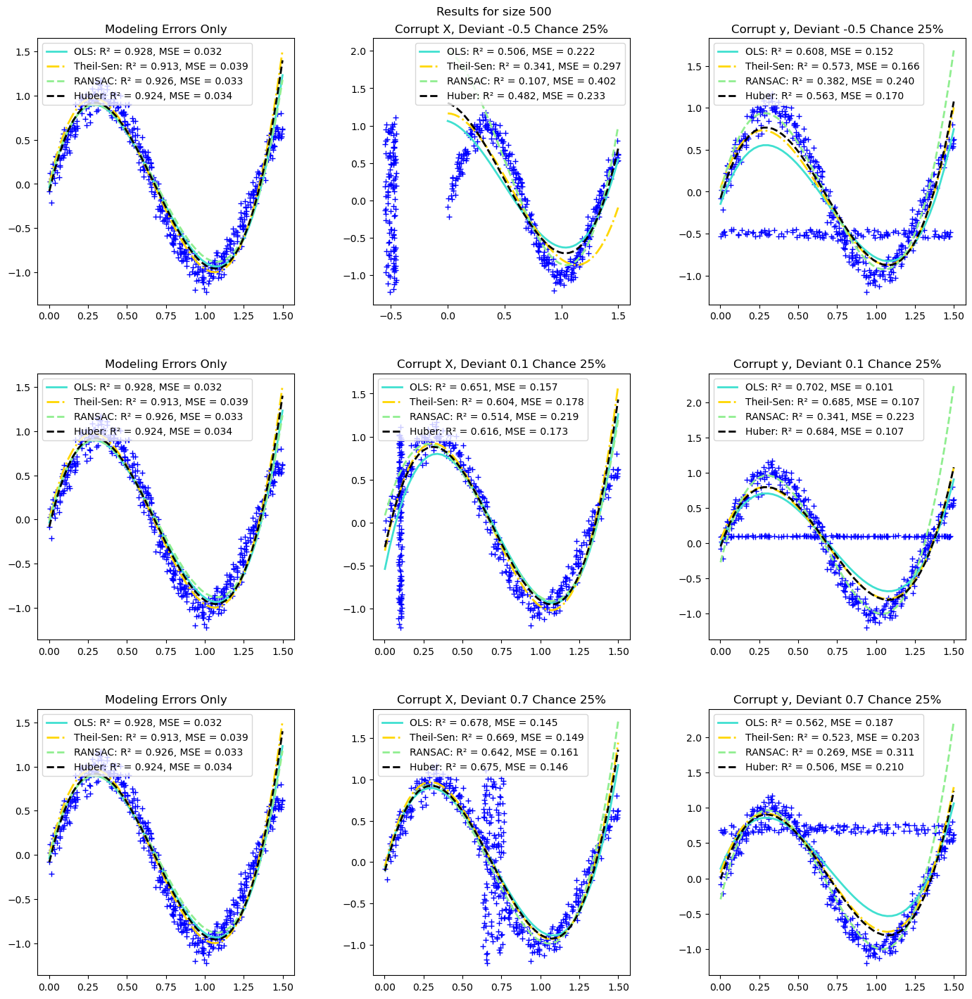

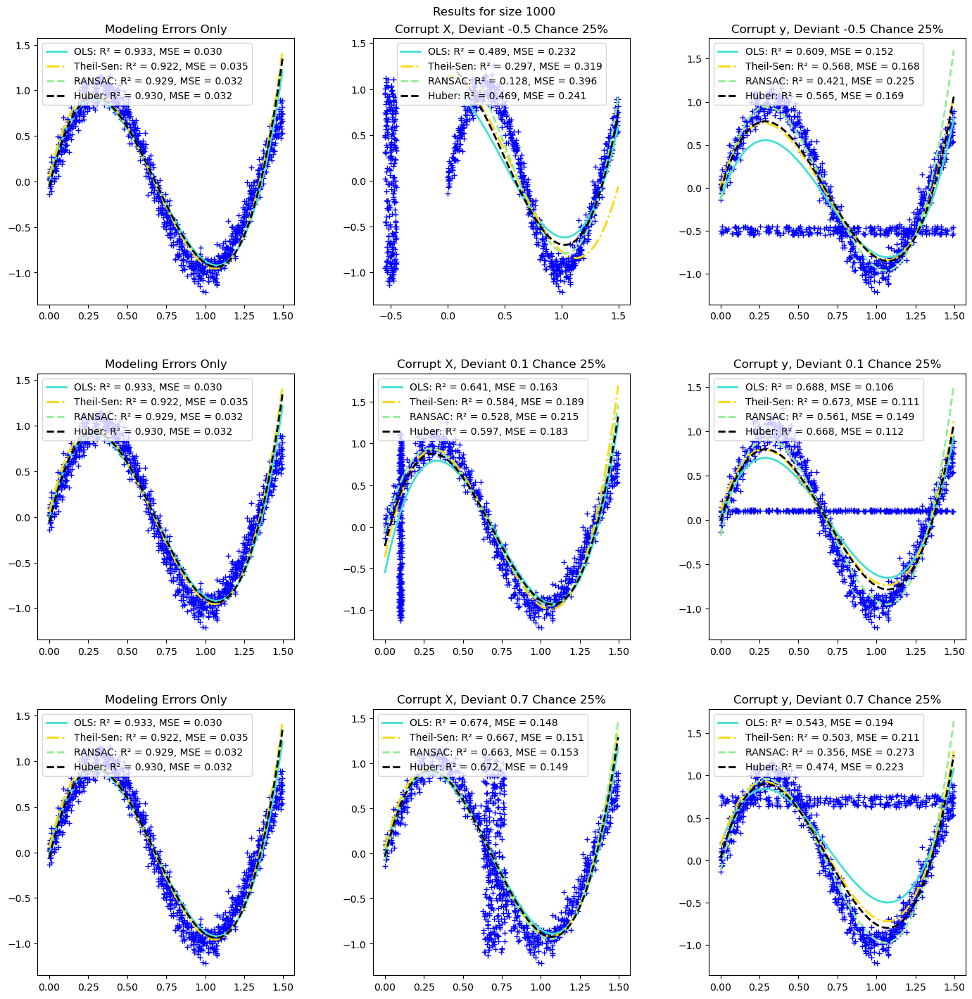

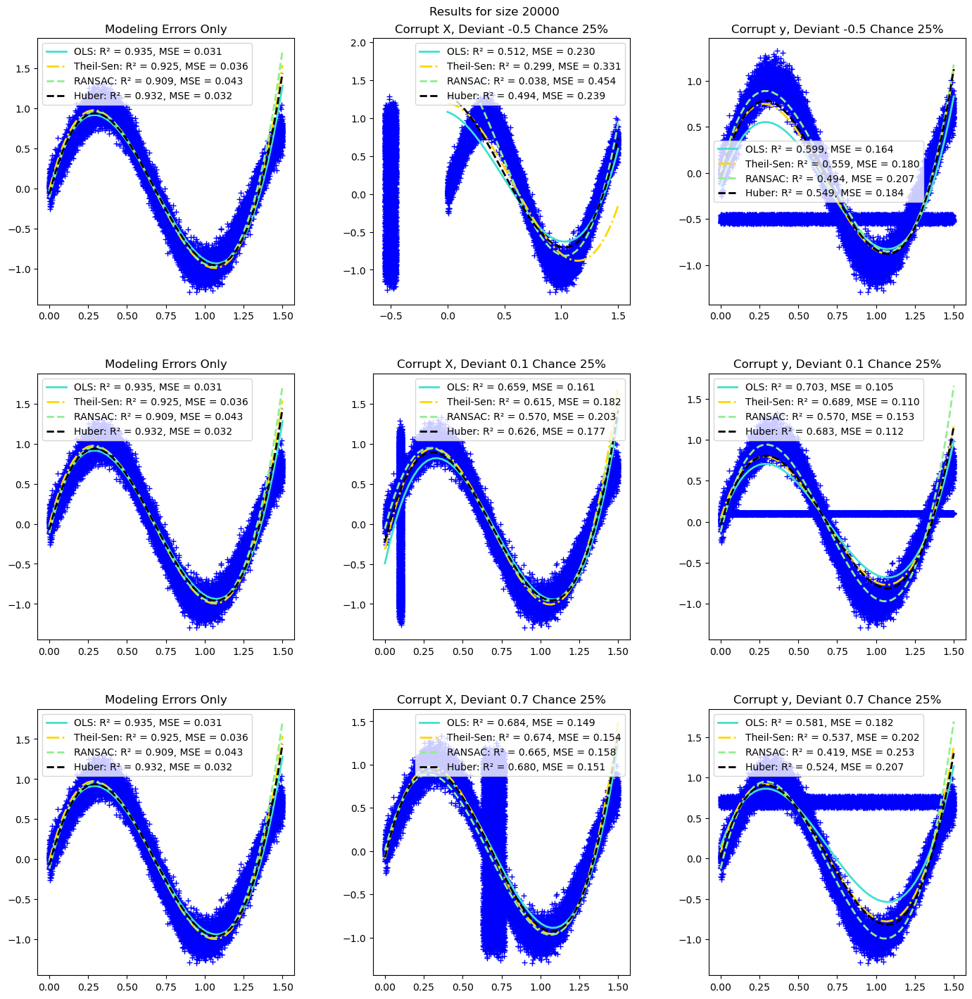

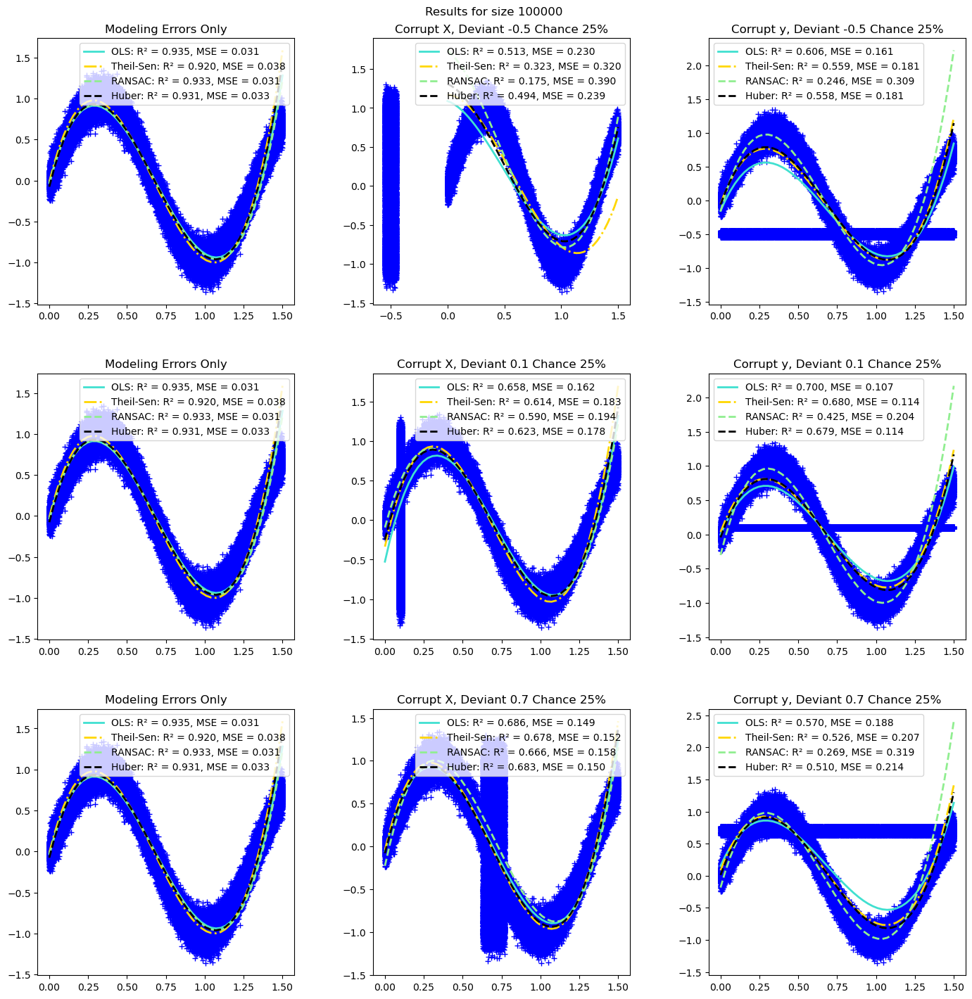

In [109]:
def ЭЭЭксперименты(size):
    X = np.random.uniform(0, 1.5, size=size)
    y = np.sin(1.5 * np.pi * X) + np.random.normal(scale=0.1, size=X.shape)
    X = X.reshape(-1, 1)

    X_test = np.random.uniform(0, 1.5, size=size)
    y_test = np.sin(1.5 * np.pi * X_test) + np.random.normal(scale=0.1, size=X_test.shape)
    X_test = X_test.reshape(-1, 1)
    
    deviants = [-0.5, 0.1, 0.7]  

    fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
    fig.tight_layout(pad=5.0)
    x_plot = np.linspace(X.min(), X.max())

    for row, deviant in enumerate(deviants):
        y_errors = y.copy()
        y_errors[::4] = deviant + np.random.uniform(-np.abs(deviant*0.1), np.abs(deviant*0.1), size=y_errors[::4].shape)

        X_errors = X.copy()
        X_errors[::4] = deviant + np.random.uniform(-np.abs(deviant*0.1), np.abs(deviant*0.1), size=X_errors[::4].shape)

        estimators = {
            "OLS": LinearRegression(),
            "Theil-Sen": TheilSenRegressor(random_state=42),
            "RANSAC": RANSACRegressor(random_state=42),
            "Huber": HuberRegressor(),
        }

        colors = {
            "OLS": "turquoise",
            "Theil-Sen": "gold",
            "RANSAC": "lightgreen",
            "Huber": "black",
        }
        linestyle = {"OLS": "-", "Theil-Sen": "-.", "RANSAC": "--", "Huber": "--"}
        lw = 2

        for col, (title, this_X, this_y) in enumerate([
            ("Modeling Errors Only", X, y),
            (f"Corrupt X, Deviant {deviant} Chance 25%", X_errors, y),
            (f"Corrupt y, Deviant {deviant} Chance 25%", X, y_errors),
        ]):
            ax[row, col].plot(this_X[:, 0], this_y, "b+")
            for name, estimator in estimators.items():
                model = make_pipeline(PolynomialFeatures(degree=3), estimator)
                t0 = time.time()
                model.fit(this_X, this_y)
                r2 = model.score(this_X, this_y)
                y_pred = model.predict(this_X)
                mse = mean_squared_error(this_y, y_pred)
                y_plot = model.predict(x_plot[:, np.newaxis])
                ax[row, col].plot(
                    x_plot,
                    y_plot,
                    color=colors[name],
                    linestyle=linestyle[name],
                    linewidth=lw,
                    label="%s: R² = %.3f, MSE = %.3f" % (name, r2, mse),
                )
            ax[row, col].title.set_text(title)
            ax[row, col].legend(loc='best')

    plt.suptitle(f"Results for size {size}")
    plt.show()

for size in [500, 1000, 20000, 100000]:
    ЭЭЭксперименты(size)

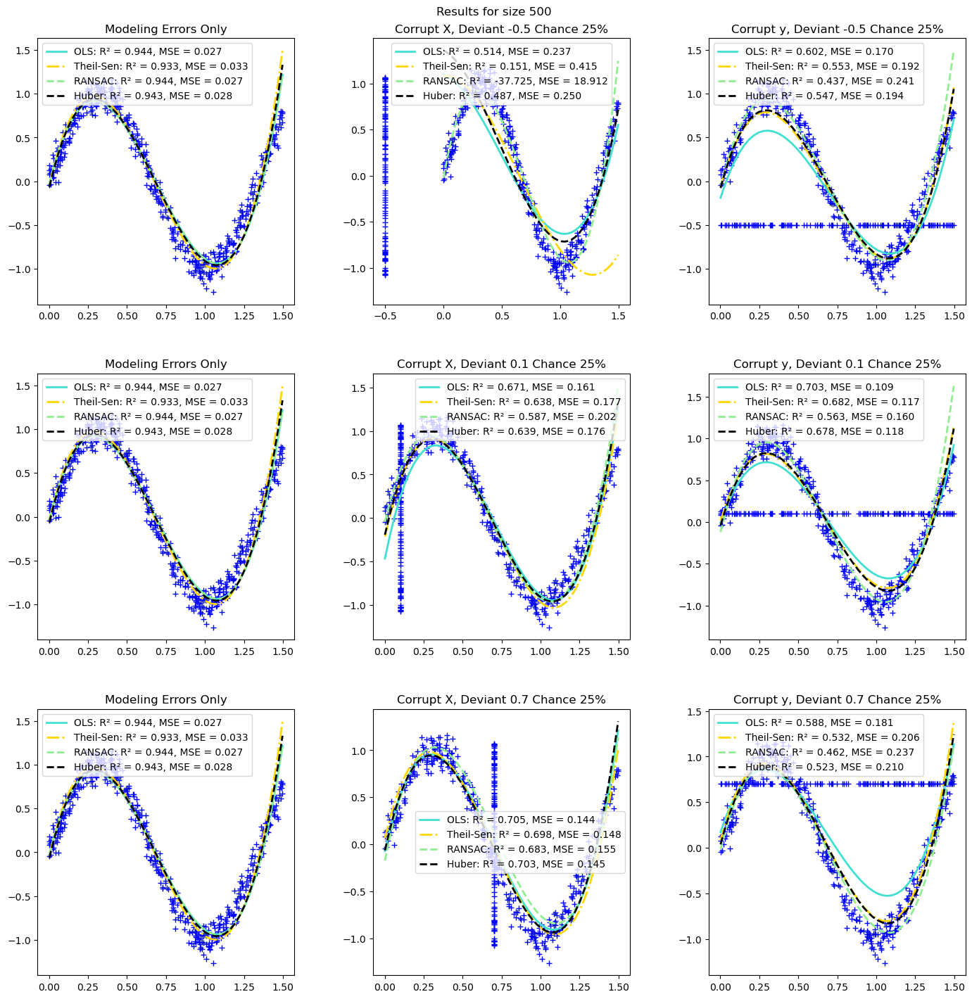

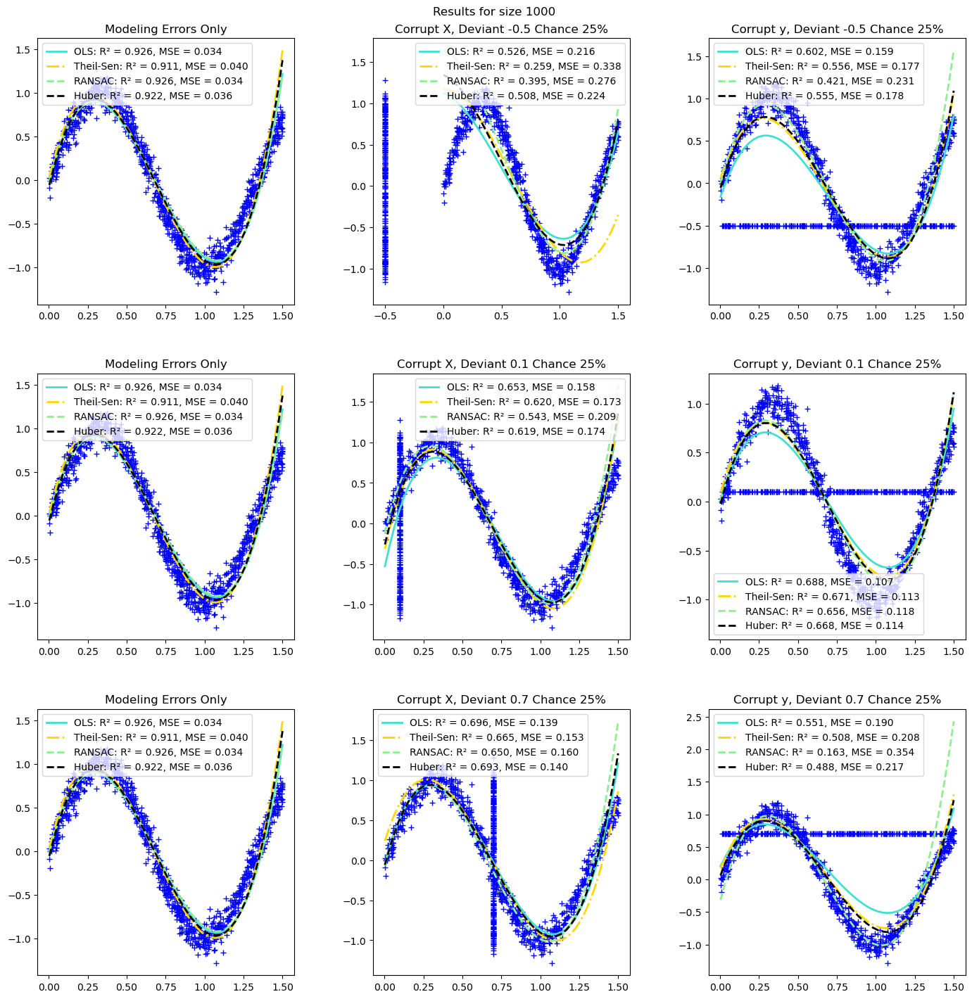

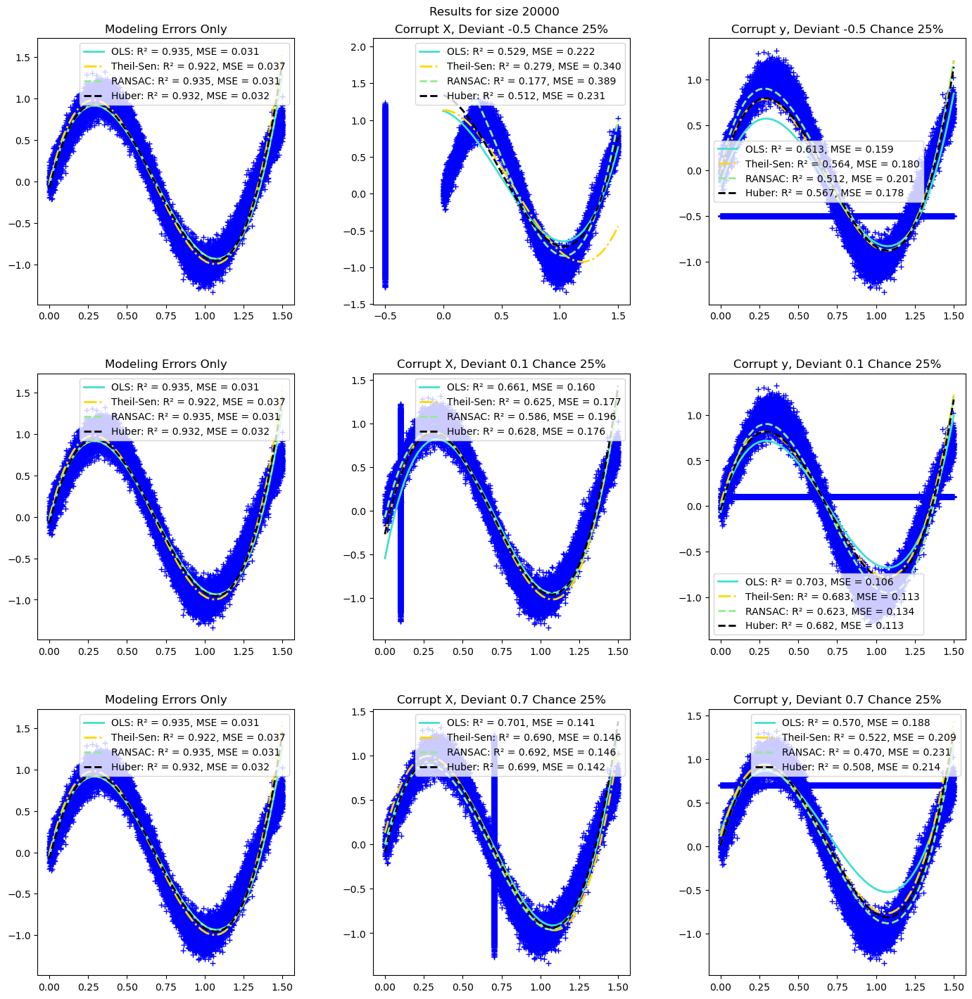

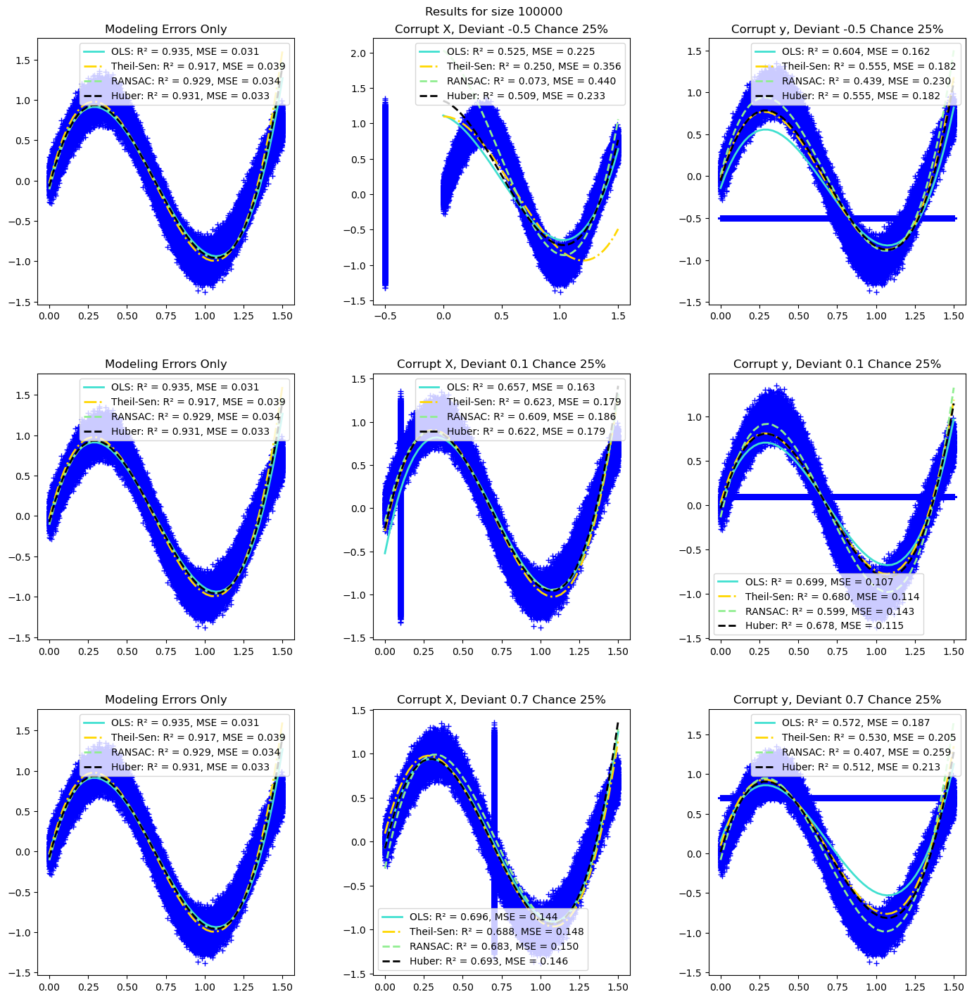

In [64]:
def ЭЭЭксперименты(size):
    X = np.random.uniform(0, 1.5, size=size)
    y = np.sin(1.5 * np.pi * X) + np.random.normal(scale=0.1, size=X.shape)
    X = X.reshape(-1, 1)

    X_test = np.random.uniform(0, 1.5, size=size)
    y_test = np.sin(1.5 * np.pi * X_test) + np.random.normal(scale=0.1, size=X_test.shape)
    X_test = X_test.reshape(-1, 1)
    
    deviants = [-0.5, 0.1, 0.7]  

    fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
    fig.tight_layout(pad=5.0)
    x_plot = np.linspace(X.min(), X.max())

    for row, deviant in enumerate(deviants):
        y_errors = y.copy()
        y_errors[::4] = deviant

        X_errors = X.copy()
        X_errors[::4] = deviant

        estimators = {
            "OLS": LinearRegression(),
            "Theil-Sen": TheilSenRegressor(random_state=42),
            "RANSAC": RANSACRegressor(random_state=42),
            "Huber": HuberRegressor(),
        }

        colors = {
            "OLS": "turquoise",
            "Theil-Sen": "gold",
            "RANSAC": "lightgreen",
            "Huber": "black",
        }
        linestyle = {"OLS": "-", "Theil-Sen": "-.", "RANSAC": "--", "Huber": "--"}
        lw = 2

        for col, (title, this_X, this_y) in enumerate([
            ("Modeling Errors Only", X, y),
            (f"Corrupt X, Deviant {deviant} Chance 25%", X_errors, y),
            (f"Corrupt y, Deviant {deviant} Chance 25%", X, y_errors),
        ]):
            ax[row, col].plot(this_X[:, 0], this_y, "b+")
            for name, estimator in estimators.items():
                model = make_pipeline(PolynomialFeatures(degree=3), estimator)
                t0 = time.time()
                model.fit(this_X, this_y)
                r2 = model.score(this_X, this_y)
                y_pred = model.predict(this_X)
                mse = mean_squared_error(this_y, y_pred)
                y_plot = model.predict(x_plot[:, np.newaxis])
                ax[row, col].plot(
                    x_plot,
                    y_plot,
                    color=colors[name],
                    linestyle=linestyle[name],
                    linewidth=lw,
                    label="%s: R² = %.3f, MSE = %.3f" % (name, r2, mse),
                )
            ax[row, col].title.set_text(title)
            ax[row, col].legend(loc='best')

    plt.suptitle(f"Results for size {size}")
    plt.show()

for size in [500, 1000, 20000, 100000]:
    ЭЭЭксперименты(size)

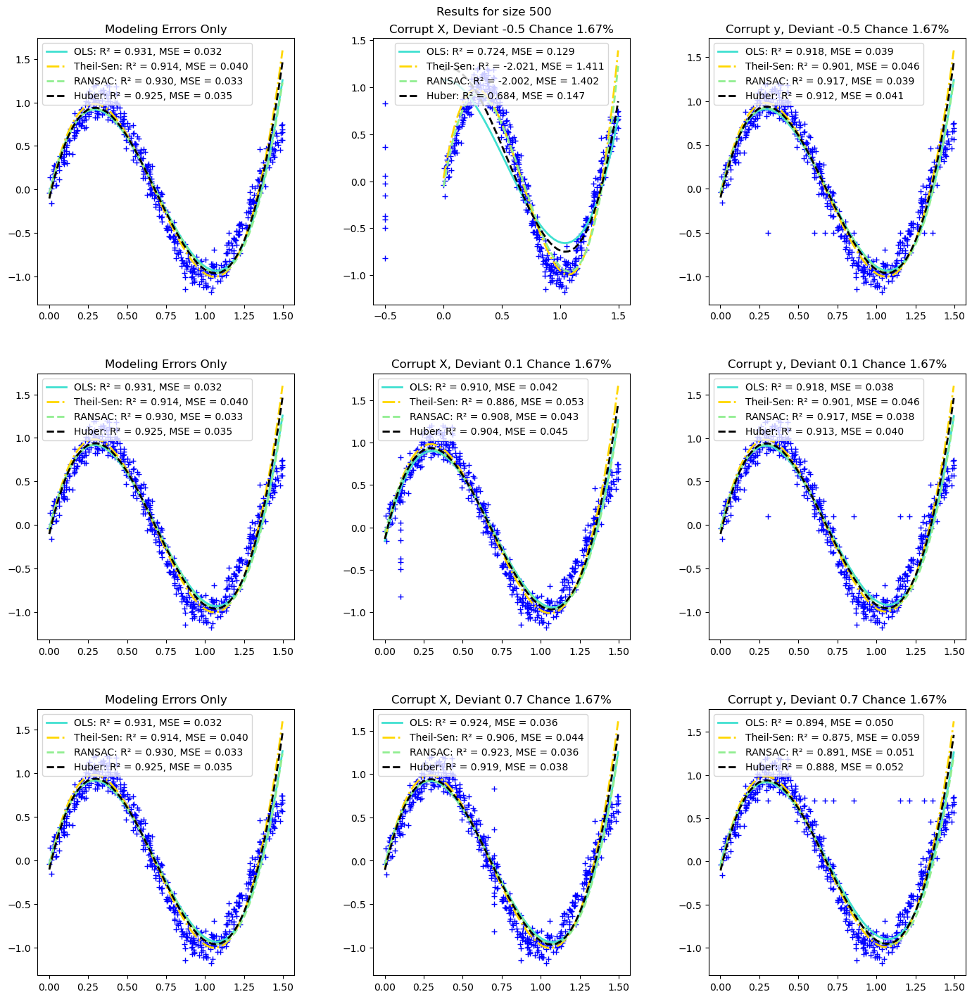

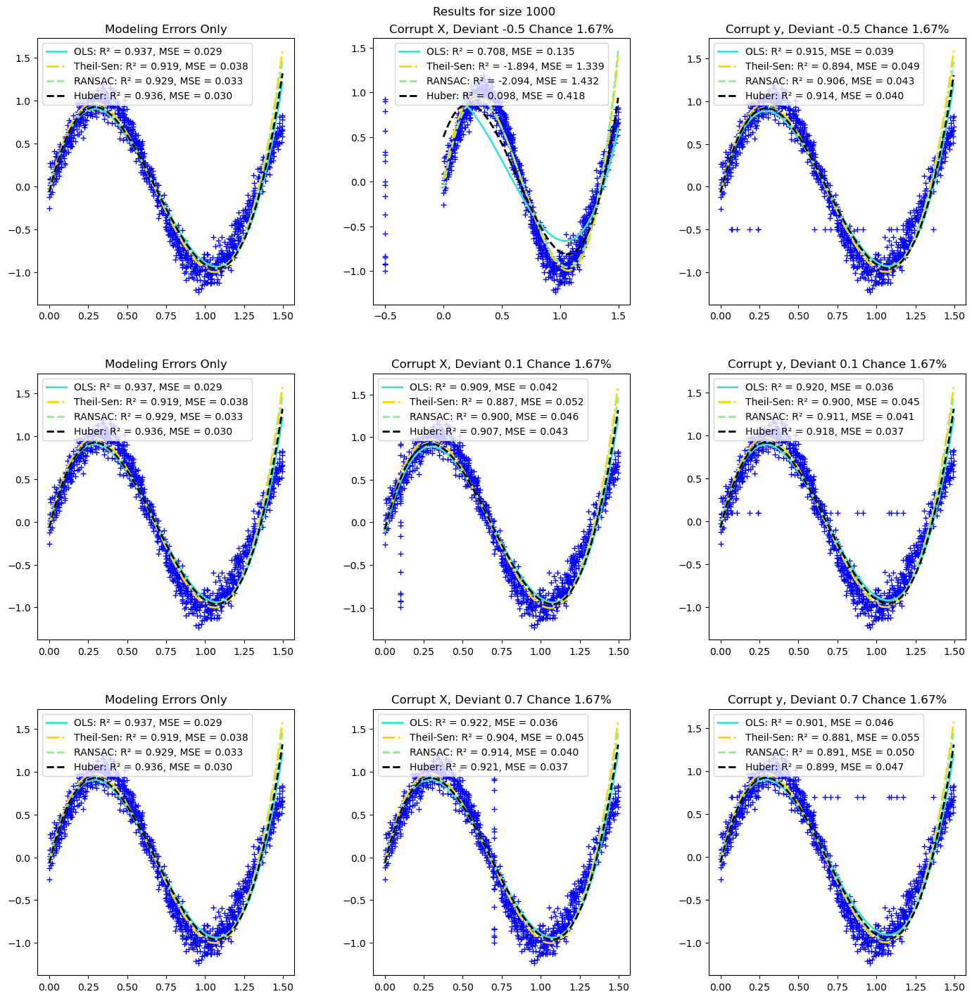

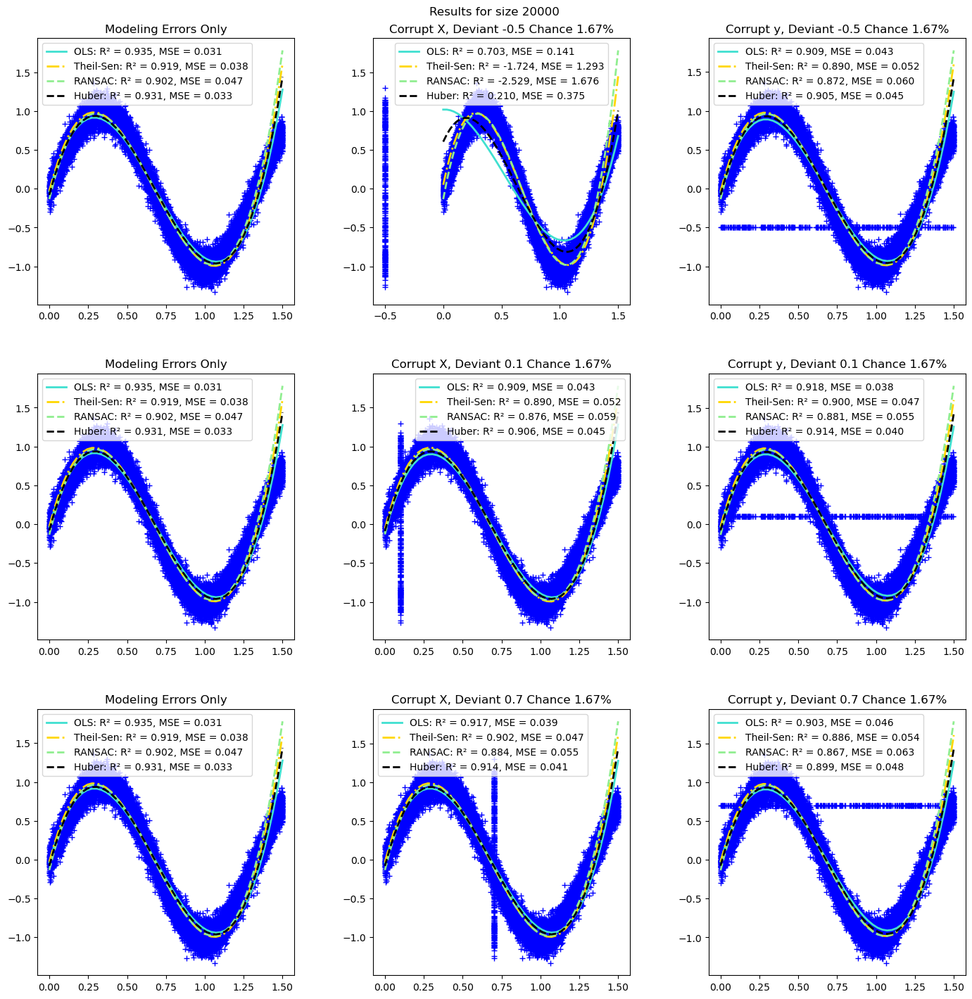

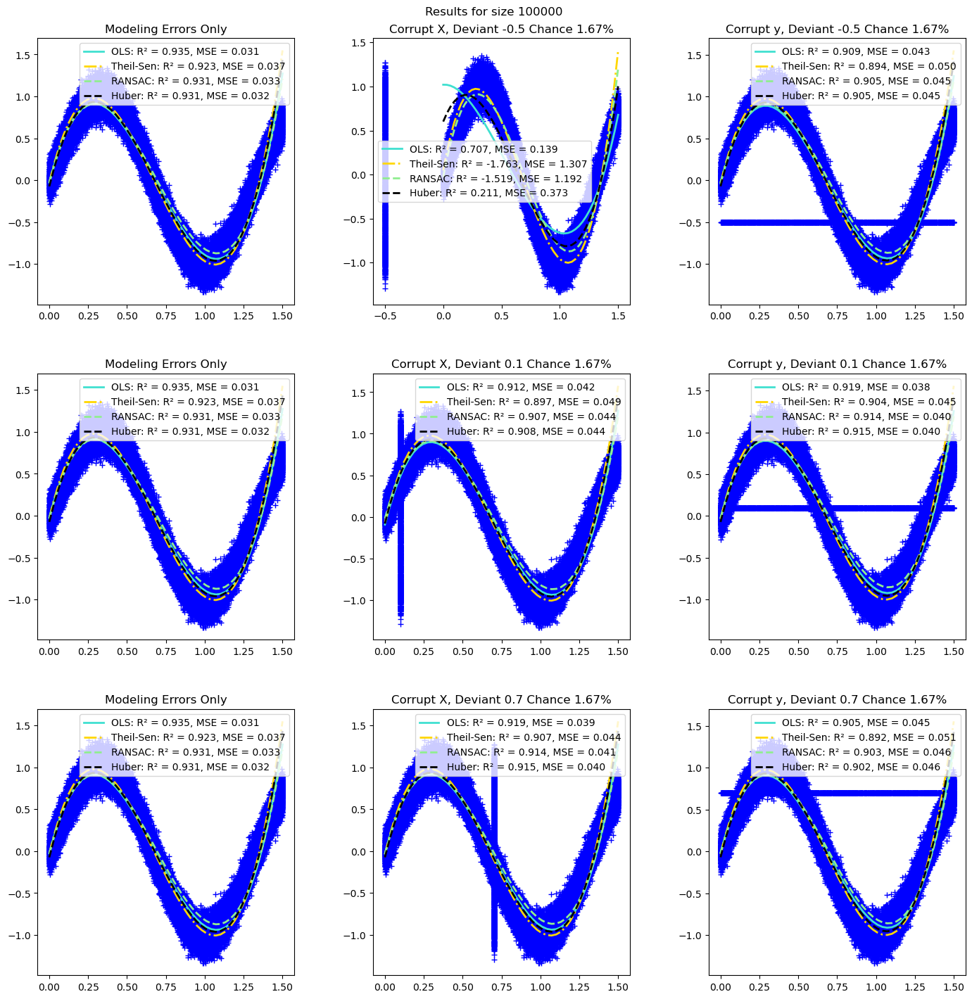

In [65]:
def ЭЭЭксперименты(size):
    X = np.random.uniform(0, 1.5, size=size)
    y = np.sin(1.5 * np.pi * X) + np.random.normal(scale=0.1, size=X.shape)
    X = X.reshape(-1, 1)

    X_test = np.random.uniform(0, 1.5, size=size)
    y_test = np.sin(1.5 * np.pi * X_test) + np.random.normal(scale=0.1, size=X_test.shape)
    X_test = X_test.reshape(-1, 1)
    
    deviants = [-0.5, 0.1, 0.7]  

    fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
    fig.tight_layout(pad=5.0)
    x_plot = np.linspace(X.min(), X.max())

    for row, deviant in enumerate(deviants):
        y_errors = y.copy()
        y_errors[::60] = deviant

        X_errors = X.copy()
        X_errors[::60] = deviant

        estimators = {
            "OLS": LinearRegression(),
            "Theil-Sen": TheilSenRegressor(random_state=42),
            "RANSAC": RANSACRegressor(random_state=42),
            "Huber": HuberRegressor(),
        }

        colors = {
            "OLS": "turquoise",
            "Theil-Sen": "gold",
            "RANSAC": "lightgreen",
            "Huber": "black",
        }
        linestyle = {"OLS": "-", "Theil-Sen": "-.", "RANSAC": "--", "Huber": "--"}
        lw = 2

        for col, (title, this_X, this_y) in enumerate([
            ("Modeling Errors Only", X, y),
            (f"Corrupt X, Deviant {deviant} Chance 1.67%", X_errors, y),
            (f"Corrupt y, Deviant {deviant} Chance 1.67%", X, y_errors),
        ]):
            ax[row, col].plot(this_X[:, 0], this_y, "b+")
            for name, estimator in estimators.items():
                model = make_pipeline(PolynomialFeatures(degree=3), estimator)
                t0 = time.time()
                model.fit(this_X, this_y)
                r2 = model.score(this_X, this_y)
                y_pred = model.predict(this_X)
                mse = mean_squared_error(this_y, y_pred)
                y_plot = model.predict(x_plot[:, np.newaxis])
                ax[row, col].plot(
                    x_plot,
                    y_plot,
                    color=colors[name],
                    linestyle=linestyle[name],
                    linewidth=lw,
                    label="%s: R² = %.3f, MSE = %.3f" % (name, r2, mse),
                )
            ax[row, col].title.set_text(title)
            ax[row, col].legend(loc='best')

    plt.suptitle(f"Results for size {size}")
    plt.show()

for size in [500, 1000, 20000, 100000]:
    ЭЭЭксперименты(size)

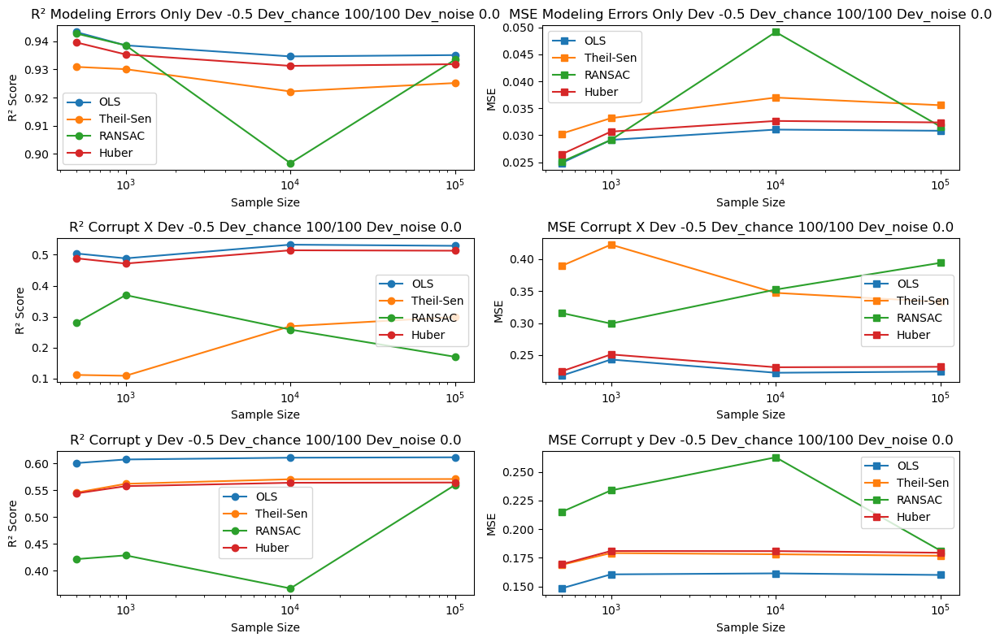

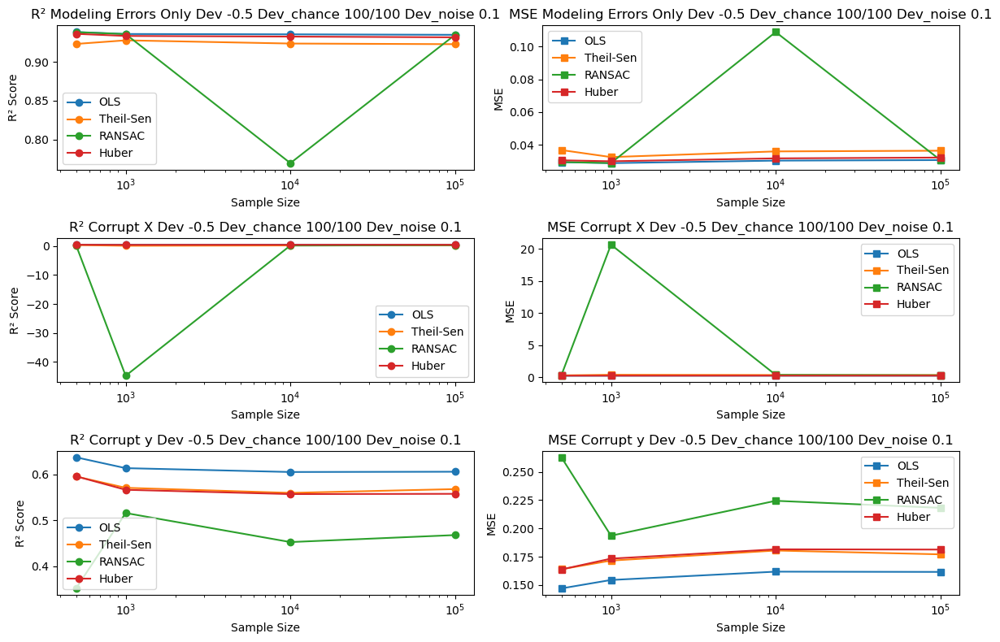

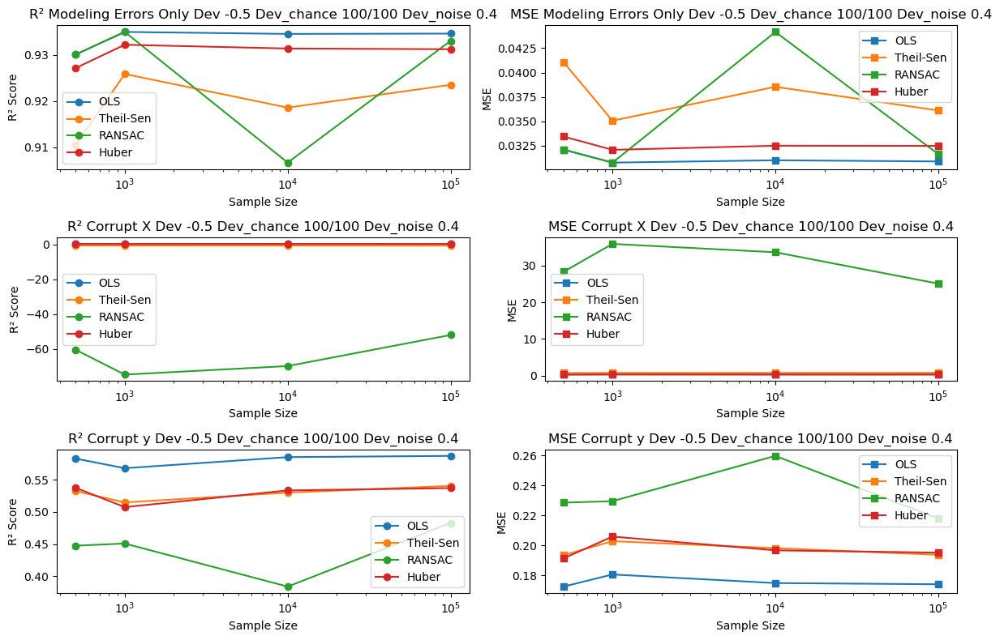

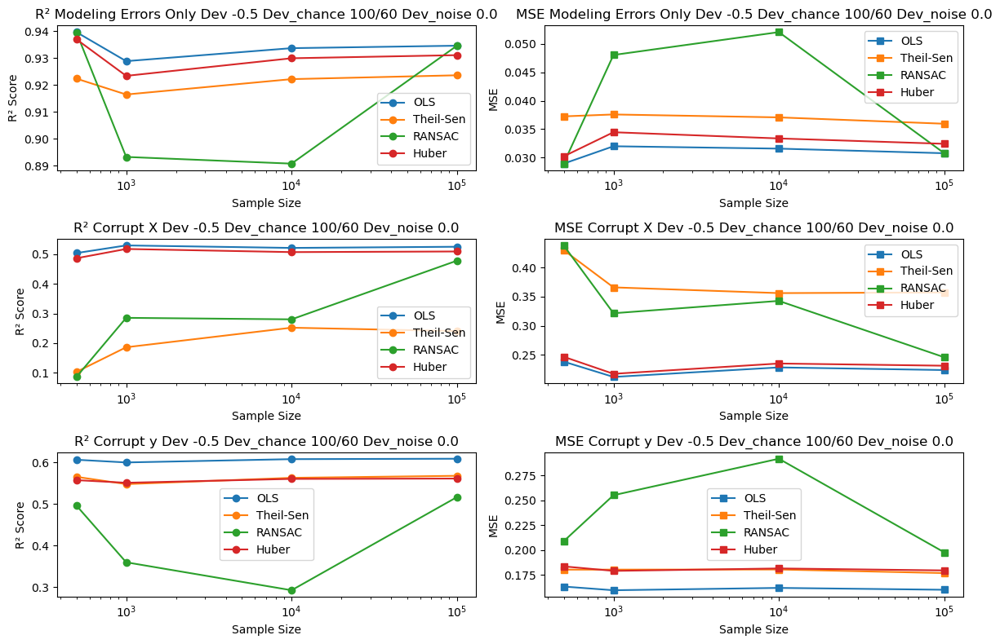

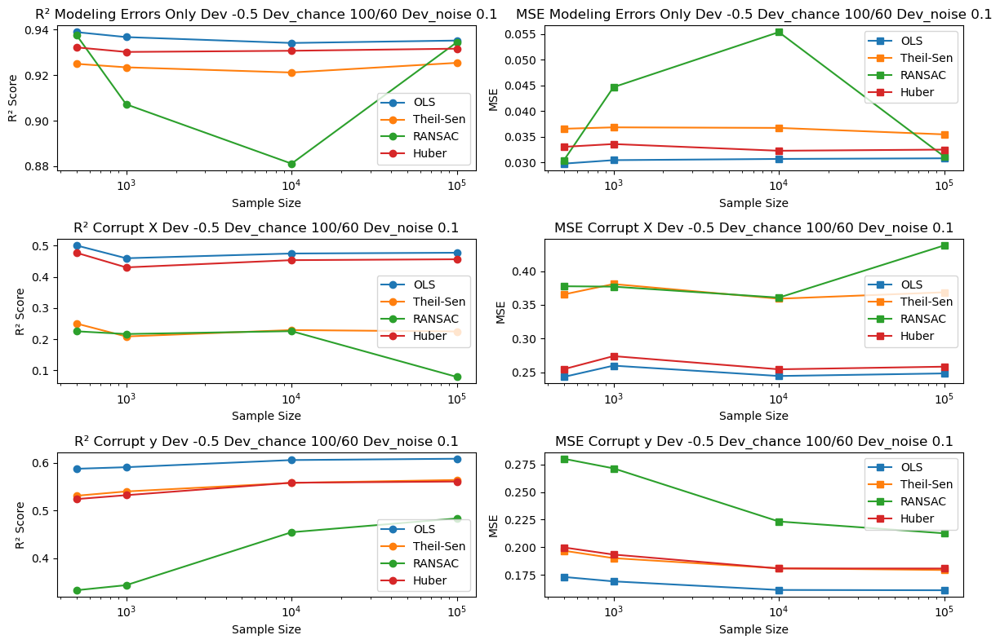

...

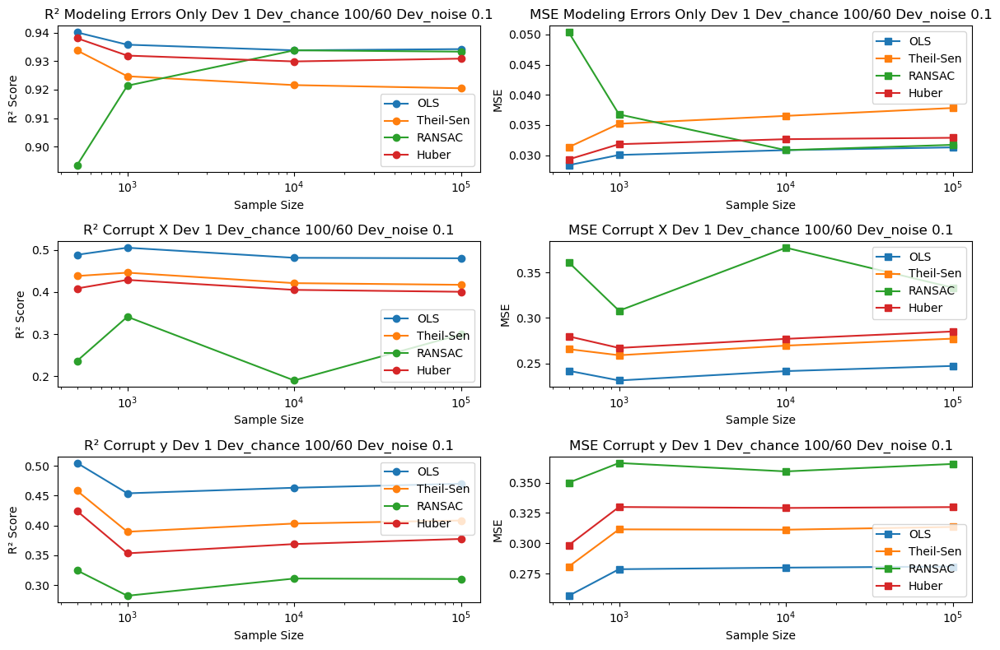

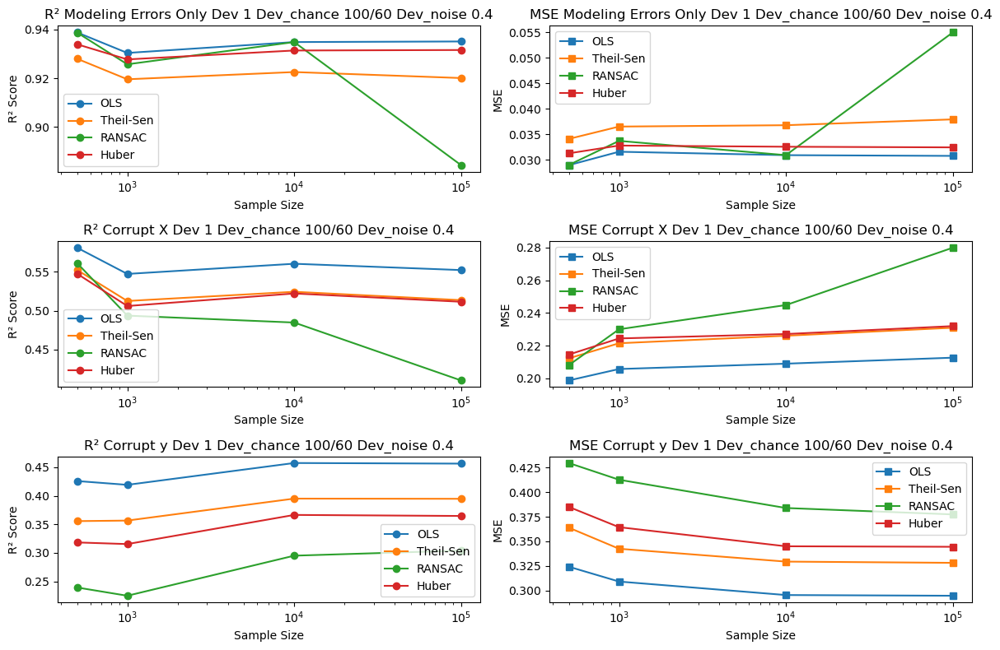

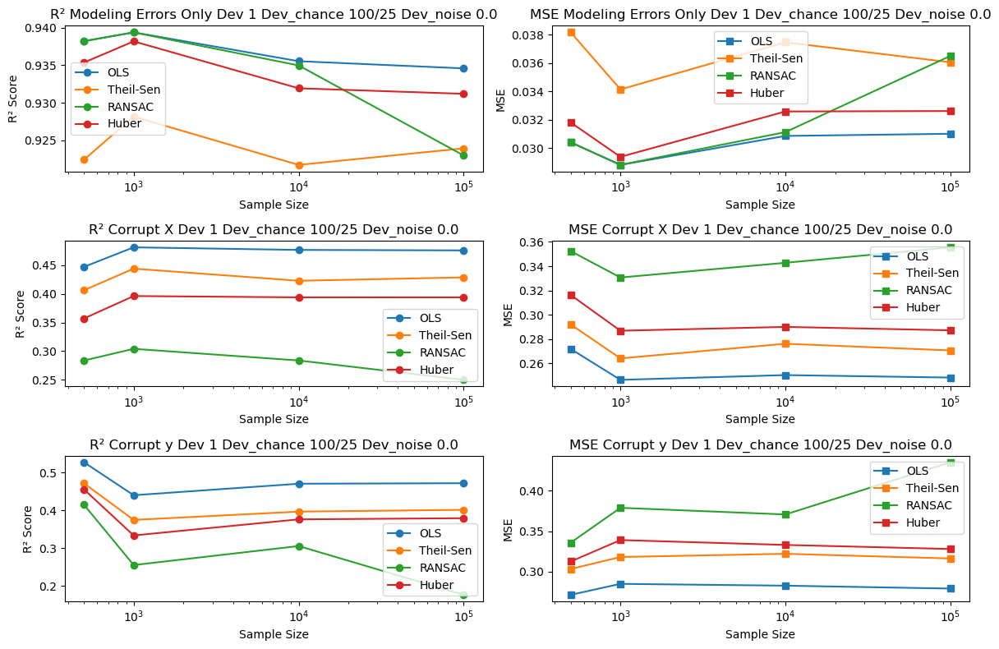

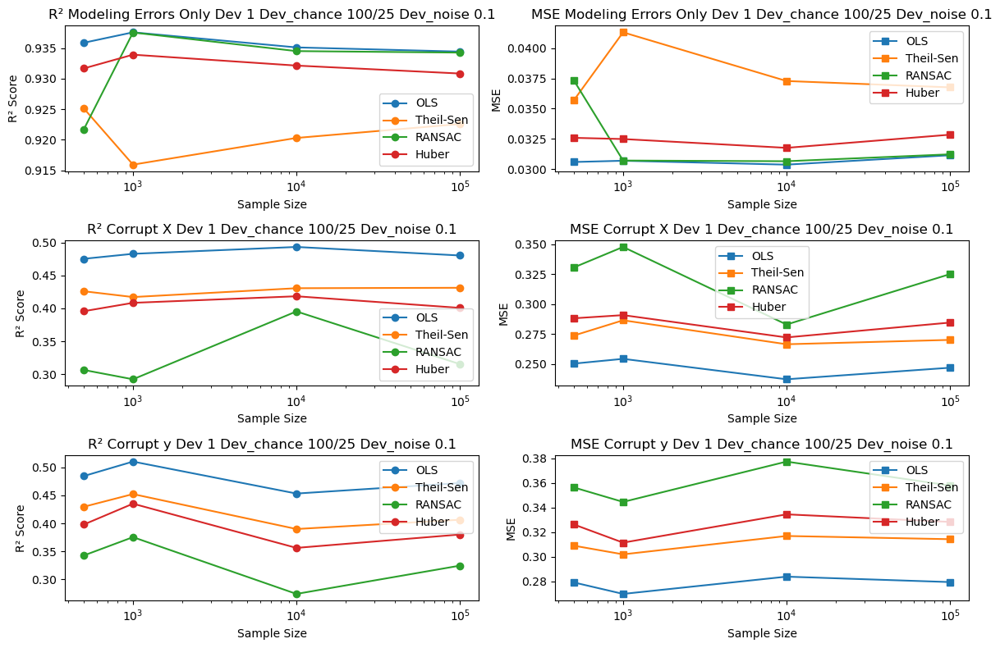

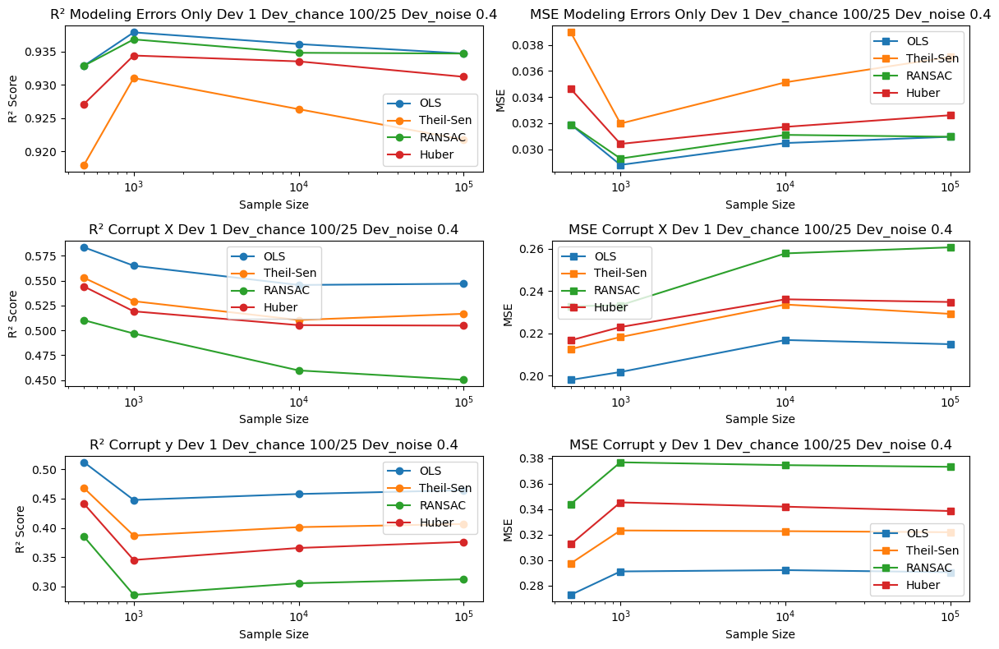

In [66]:
def analyze_r2_mse(sizes, deviant, deviant_chance, deviant_noice):
    estimators = {
        "OLS": LinearRegression(),
        "Theil-Sen": TheilSenRegressor(random_state=42),
        "RANSAC": RANSACRegressor(random_state=42),
        "Huber": HuberRegressor(),
    }
    
    results = {name: {"r2": [], "mse": []} for name in estimators}
    
    for size in sizes:
        X = np.random.uniform(0, 1.5, size=size).reshape(-1, 1)
        y = np.sin(1.5 * np.pi * X).ravel() + np.random.normal(scale=0.1, size=size)
        X = X.reshape(-1, 1)

        X_test = np.random.uniform(0, 1.5, size=size)
        y_test = np.sin(1.5 * np.pi * X_test) + np.random.normal(scale=0.1, size=X_test.shape)
        X_test = X_test.reshape(-1, 1)
        
        y_errors = y.copy()
        y_errors[::4] = deviant + np.random.uniform(-np.abs(deviant_noice), np.abs(deviant_noice), size=y_errors[::4].shape)

        X_errors = X.copy()
        X_errors[::4] = deviant + np.random.uniform(-np.abs(deviant_noice), np.abs(deviant_noice), size=X_errors[::4].shape)
        
        for col, (title, this_X, this_y) in enumerate([
            ("Modeling Errors Only", X, y),
            (f"Corrupt X", X_errors, y),
            (f"Corrupt y", X, y_errors),
        ]):
            for name, estimator in estimators.items():
                model = make_pipeline(PolynomialFeatures(degree=3), estimator)
                model.fit(this_X, this_y)
                y_pred = model.predict(this_X)
                
                results[name]["r2"].append((col, title, model.score(this_X, this_y)))
                results[name]["mse"].append((col, title, mean_squared_error(this_y, y_pred)))
        
    fig, ax = plt.subplots(3, 2, figsize=(12, 8))

    # Plot R² and MSE for each estimator and each title
    for col, (title, this_X, this_y) in enumerate([
        ("Modeling Errors Only", X, y),
        ("Corrupt X", X_errors, y),
        ("Corrupt y", X, y_errors),
    ]):
        for i, name in enumerate(estimators):
            # R² plot
            ax[col, 0].plot(sizes, [r[2] for r in results[name]["r2"] if r[1] == title], marker='o', label=name)
            ax[col, 0].set_title(f"R² {title} Dev {deviant} Dev_chance 100/{deviant_chance} Dev_noise {deviant_noice}")
            ax[col, 0].set_xlabel("Sample Size")
            ax[col, 0].set_ylabel("R² Score")
            ax[col, 0].set_xscale("log")
            ax[col, 0].legend()

            # MSE plot
            ax[col, 1].plot(sizes, [r[2] for r in results[name]["mse"] if r[1] == title], marker='s', label=name)
            ax[col, 1].set_title(f"MSE {title} Dev {deviant} Dev_chance 100/{deviant_chance} Dev_noise {deviant_noice}")
            ax[col, 1].set_xlabel("Sample Size")
            ax[col, 1].set_ylabel("MSE")
            ax[col, 1].set_xscale("log")
            ax[col, 1].legend()

    plt.tight_layout()
    plt.show()
    

sizes = [500, 1000, 10000, 100000]
deviants = [-0.5,0.1,1]
deviant_chances = [100,60,25]
deviant_noices = [0.0,0.1,0.4]
for deviant in deviants:
    for deviant_chance in deviant_chances:
        for deviant_noice in deviant_noices:
            analyze_r2_mse(sizes, deviant, deviant_chance, deviant_noice)


## Гетероскедастичность

- **Вопрос 1**: Что такое гетероскедастичность?
- дисперсия ошибки изменяется в зависимости от значений независимых переменных
- **Вопрос 2**: Какие последствия гетероскедастичности - почему положение о гомоскедачности так важно? 
- t-test и p-value перестают быть точными. доверительные интервалы недостоверы
- **Вопрос 3**: Мы наблюдаем гетероскедастичсность. Предложите примеры гетероскедастичности. В каких  случаях это нарушение возникает из-за нарушения других положений? 
- варьирование цен на жилье, чем выше цена тем больше разница между ценами. В случае автокорреляции может возникать гетероседастичность.

В этой части рассмотрим данные о стоимости домовладения. При этом будем использовать следующие признаки:
* Y = стоимость дома
* X1 = площадь дома
* X2 = площадь участка
Подмножество набора данных об исследовании американского сообщества, полученного из Бюро переписей США.

In [67]:
data = pd.read_csv(f"{data_path}/realestate.txt", sep="\t") # pd.read_csv(f"{data_path}/realestate.csv").dropna()

In [68]:
# Делаем доп.датасет со всеми положениями
linear_X, linear_y = datasets.make_regression(n_samples=data.shape[0],
                                              n_features=data.shape[1],
                                              noise=75, random_state=46)

# Setting feature names to x1, x2, x3, etc. if they are not defined
linear_feature_names = ['X'+str(feature+1) for feature in range(linear_X.shape[1])]

In [69]:
data.columns

Index(['SalePrice', 'SqFeet', 'Beds', 'Baths', 'Air', 'Garage', 'Pool', 'Year',
       'Quality', 'Style', 'Lot', 'Highway'],
      dtype='object')

In [70]:
X_train, X_test, y_train, y_test = train_test_split(data[["SqFeet"]], np.log(data["SalePrice"]))

Если провести регрессионный анализ и оценить график остатков в сравнении с предсказанными значениями, можно отметить несколько «коническую» форму остатков.

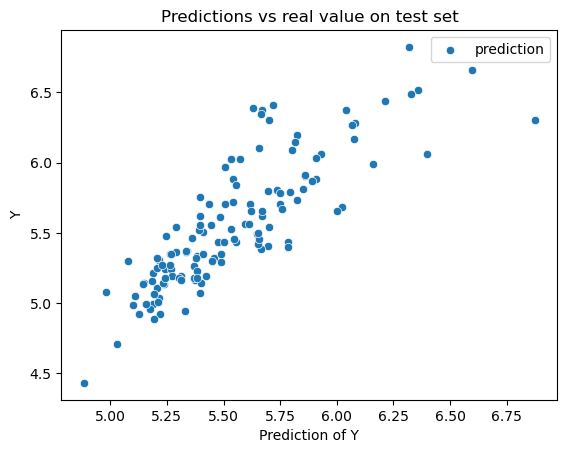

In [71]:
model = LinearRegression()
model.fit(X_train, y_train)
preds = model.predict(X_test)
sns.scatterplot(x=preds, y=y_test, label="prediction")
plt.xlabel('Prediction of Y')
plt.ylabel('Y')
plt.legend()
plt.title(f'Predictions vs real value on test set')
plt.show()

In [72]:
print(f"The score of prediction is: {model.score(X_test, y_test)}")

The score of prediction is: 0.6985652667805176


Другой способ построить график остатков предлагает Sklearn

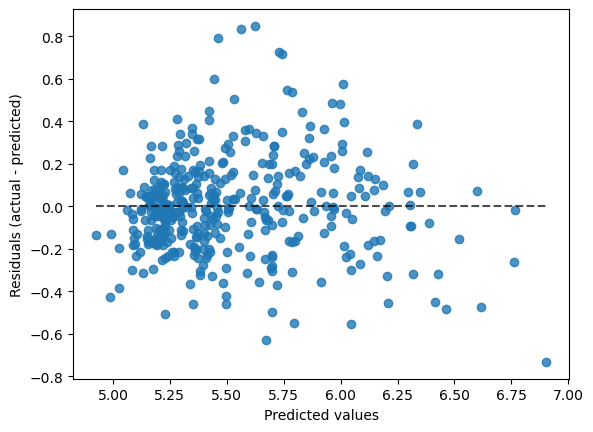

In [73]:
from sklearn.metrics import PredictionErrorDisplay
display = PredictionErrorDisplay(y_true=y_train, y_pred=model.predict(X_train))
display.plot()
plt.show()

Более объективную оценку могут дать специальные статистические тесты, например, тест Уайта или тест Брейша-Пагана

In [74]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.tools.tools as smt
import statsmodels.stats.diagnostic as smd

Тест Бреуша-Пагана  можно выполнить с помощью функции het_breuschpagan модуля statsmodels.stats.diagnostic для оценки того, объясняют ли независимые переменные дисперсию ошибок. Основные параметры функции het_breuschpagan resid - остатки модели, а exog_het — независимые переменные. Обратите внимание, что ему нужна также константная переменная. 
Этот тест проверяет нулевую гипотезу о том, что все дисперсии ошибок равны, в сравнении с альтернативой, согласно которой дисперсии ошибок являются мультипликативной функцией одной или нескольких переменных. Этот тест затрагивает линейную форму гетероскедастичности.

Тест Уайта (het_white) оценивает то, объясняют ли независимые переменные линейной регрессии, квадратичные независимые переменные и перемножения независимых переменных дисперсию ошибок. Он не накладывает ограничений на форму гетероскедастичности.  Внутри происходит регрессия квадратов остатков по отношению к исодным переменным, их квадратам и попарным произведениям. Он более обзий как раз из-за добавления дополнительных переменных. Например, квадраты позволяют найти гетероскедастичность в форме "песочных часов". Однако, у него есть минус в том, что исходная гипотеза разбивается на несколько.

**Вопрос**: почему это минус? Укажите теоретическую причину. 
- При малых выборках тест Уайта хуже выялвет гетероскедастичность, т.к при малом кол-ве доп параметров вариативность выборки уменьшается.


Основные параметры в функции het_white resid - остатки, а exog - независимые переменные для объяснения дисперсии ошибок модели. 

Выполним тесты для нашего датасета, чтобы понять, реально ли в модели присутствует гетероскедастичность.

In [75]:
def get_residual_df(model, features, label):
    """
    Creates predictions on the features with the model and calculates residuals
    """
    predictions = model.predict(features)
    df_results = pd.DataFrame({'Actual': label, 'Predicted': predictions})
    df_results['Residuals'] = df_results['Actual'] - df_results['Predicted']
    
    return df_results


In [76]:
res_train = get_residual_df(model, X_train, y_train)
res_test = get_residual_df(model, X_test, y_test)

In [77]:
X_test_new = X_test.copy()
X_test_new["const"]=1.

In [78]:
res_test.head(5)

,Actual,Predicted,Residuals
393,5.437644,5.784696,-0.347051
387,5.370638,5.337455,0.033183
23,4.944495,5.328480,-0.383984
241,5.262172,5.370362,-0.108190
12,6.282267,6.080862,0.201405


In [79]:
bptest = smd.het_breuschpagan(resid=res_test["Residuals"], exog_het=X_test_new)
print("lm:", bptest[0], "lm_pvalue:", bptest[1])

lm: 6.4714189590425395 lm_pvalue: 0.010962297203584517


**Вопрос**: что означает pvalue? Можем ли мы сказать, что остатки гетероскедачстичны?

In [80]:
wtest = smd.het_white(resid=res_test["Residuals"], exog=X_test_new)
print("lm:", wtest[0], "lm_pvalue:", wtest[1])

lm: 6.513016098887098 lm_pvalue: 0.03852268272670066


### Решение проблемы
**Вопрос**: Как можно избавиться от гетероскедастичности (или уменьшить ее влияние)? 

Линейная модель описывается уравнением \begin{equation*} \textbf{Y}=\textbf{X}\beta+\epsilon^{*}, \end{equation*}
При этом $ \epsilon^{*} $ распределены нормально с нулевым средним и изменяющейся дисперсией:
\begin{equation*} \left(\begin{array}{cccc} \sigma^{2}_{1} & 0 & \ldots & 0 \\ 0 & \sigma^{2}_{2} & \ldots & 0 \\ \vdots & \vdots & \ddots & \vdots \\ 0 & 0 & \ldots & \sigma^{2}_{n} \\ \end{array} \right) \end{equation*}
Тогда мы можем определить веса $ w_i = 1/\sigma^{2}_{i} $ так чтобы
\begin{equation*}\textbf{W}=\left( \begin{array}{cccc} w_{1} & 0 & \ldots & 0 \\ 0& w_{2} & \ldots & 0 \\ \vdots & \vdots & \ddots & \vdots \\ 0& 0 & \ldots & w_{n} \\ \end{array} \right) \end{equation*}


Поскольку каждый вес обратно пропорционален дисперсии ошибки, он отражает информацию, содержащуюся в этом наблюдении. Итак, наблюдение с небольшой дисперсией ошибки имеет большой вес, поскольку оно содержит относительно больше информации, чем наблюдение с большой дисперсией ошибки (малый вес).
Веса должны быть известны (или, чаще всего, оценены) с точностью до константы пропорциональности.

Тогда можно поставить задачу взвешенной регрессиии \begin{equation*} \sum_{i=1}^n w_i^2(y_i - (\alpha 1 + \beta x_i))^2 = \sum_{i=1}^n (w_i y_i - (\alpha w_i + \beta w_i x_i))^2
\end{equation*}


Так как остатки в нашей задаче зависят от величины Y, мы можем предсказать их по этому признаку. Однако, наприямую мы это сделать не можем, так как 

**Задание**: Постройте взвешенную модель, учитывающую гетероскедастичность. Для построения весов используйте аппроксимацию ошибки.

In [81]:
negative_prices = data[data["SalePrice"] <= 1000]

# Display the results
print(negative_prices)

     SalePrice  SqFeet  Beds  Baths  Air  Garage  Pool  Year  Quality  Style  \
0        360.0   3.032     4      4    1       2     0  1972        2      1   
1        340.0   2.058     4      2    1       2     0  1976        2      1   
2        250.0   1.780     4      3    1       2     0  1980        2      1   
3        205.5   1.638     4      2    1       2     0  1963        2      1   
4        275.5   2.196     4      3    1       2     0  1968        2      7   
..         ...     ...   ...    ...  ...     ...   ...   ...      ...    ...   
516      137.0   1.655     2      1    0       1     0  1935        3      1   
517      185.0   1.944     3      2    1       2     0  1939        3      6   
518      133.5   1.922     3      1    0       2     0  1950        3      1   
519      124.0   1.480     3      2    1       2     0  1953        3      1   
520       95.5   1.184     2      1    0       1     0  1951        3      1   

        Lot  Highway  
0    22.221     

In [82]:
# force all estimates to be positive
add_y_train = np.abs(y_train)
add_y_test = np.abs(y_test)


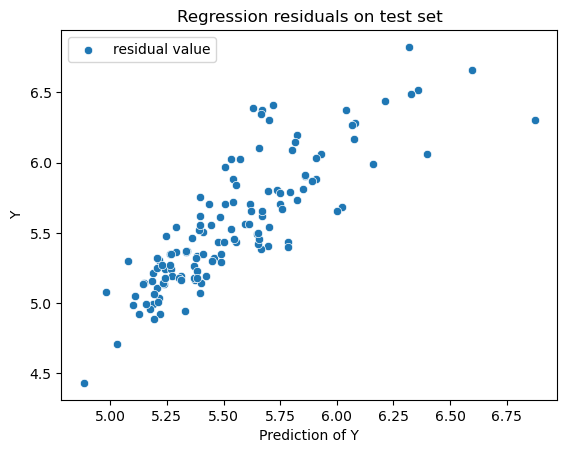

In [83]:
# Fit a regression model
sns.scatterplot(x=preds, y=y_test, label="residual value")
plt.xlabel('Prediction of Y')
plt.ylabel('Y')
plt.legend()
plt.title(f'Regression residuals on test set')
plt.show()

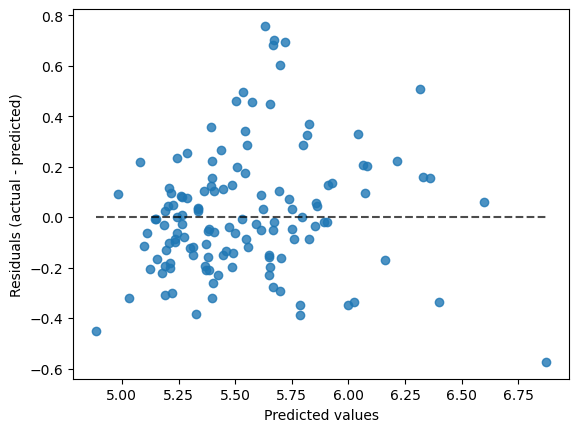

In [84]:
weight_regressor = LinearRegression().fit(np.abs(X_train), add_y_train)
residual_estimates_train = weight_regressor.predict(np.abs(X_train))
residual_estimates_test = weight_regressor.predict(np.abs(X_test))
display = PredictionErrorDisplay(y_true=add_y_test, y_pred=residual_estimates_test)
display.plot()
plt.show()

In [85]:
residual_train = add_y_train - residual_estimates_train
residual_test = add_y_test - residual_estimates_test

weights_train = 1 / np.square(residual_train)
weights_test = 1 / np.square(residual_test)

In [86]:
updated_model = LinearRegression().fit(X_train, y_train, weights_train)
updated_preds = updated_model.predict(X_test)

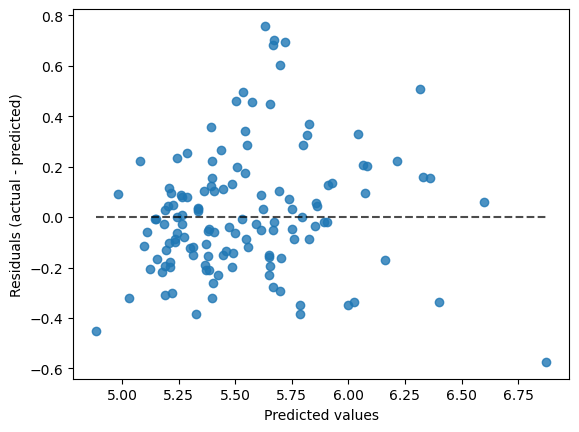

In [87]:
display = PredictionErrorDisplay(
    y_true=add_y_test, y_pred = updated_preds
    )
display.plot()
plt.show()

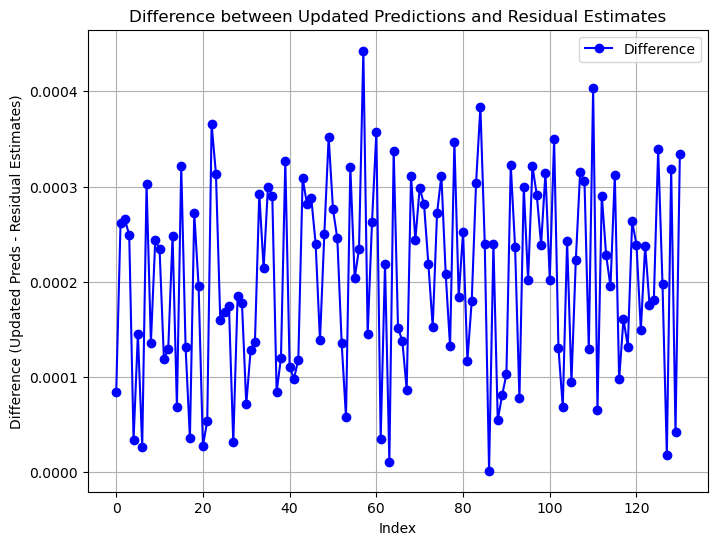

In [88]:
difference = np.abs(residual_estimates_test - updated_preds)

plt.figure(figsize=(8, 6))
plt.plot(difference, marker='o', linestyle='-', color='b', label='Difference')
plt.xlabel('Index')
plt.ylabel('Difference (Updated Preds - Residual Estimates)')
plt.title('Difference between Updated Predictions and Residual Estimates')
plt.legend()
plt.grid(True)
plt.show()

In [89]:
print(f"The score of prediction is: {updated_model.score(X_test, y_test)}")

The score of prediction is: 0.6985879711183096


In [90]:
X_test_new = X_test.copy()
X_test_new["const"]=1.

In [91]:
bptest = smd.het_breuschpagan(resid=(y_test-updated_preds), exog_het=X_test_new)
print("lm:", bptest[0], "lm_pvalue:", bptest[1])

lm: 6.48302111348179 lm_pvalue: 0.010890971713682463


In [92]:
wtest = smd.het_white(resid=(y_test-updated_preds), exog=X_test_new)
print("lm:", wtest[0], "lm_pvalue:", wtest[1])

lm: 6.524331438775442 lm_pvalue: 0.03830534948207409


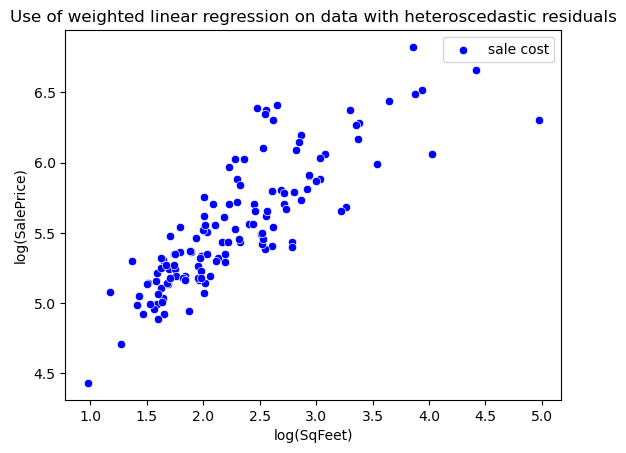

In [93]:
sns.scatterplot(x=X_test["SqFeet"], y=y_test, label='sale cost', color='blue')
# Постройте два графика моделей.
plt.xlabel('log(SqFeet)')
plt.ylabel('log(SalePrice)')
plt.legend()
plt.title(f'Use of weighted linear regression on data with heteroscedastic residuals')
plt.show()

В нашем случае остатки линейной регрессии симметричны, поэтому мы можем легко перейти на квантильную регрессиию, которая позволяет оценить заданные квантили таргета. Этот регрессор минимизирует MAE, в отличие от стандартной регрессии.

Вопрос: Почему он минимизирует MAE?

Ответ: МАЕ нацелена на предсказание определенного квантиля для распределения зависимой переменной.


In [94]:
from sklearn.linear_model import QuantileRegressor

In [95]:
quantiles = [0.05, 0.5, 0.95]
predictions = {}
out_bounds_predictions_test = np.zeros_like(y_test, dtype=np.bool_)
for quantile in quantiles:
    qr = QuantileRegressor(quantile=quantile, alpha=0)
    y_pred = qr.fit(X_train, y_train).predict(X_test)
    predictions[quantile] = y_pred

    if quantile == min(quantiles):
        out_bounds_predictions_test = np.logical_or(
            out_bounds_predictions_test, y_pred >= y_test
        )
    elif quantile == max(quantiles):
        out_bounds_predictions_test = np.logical_or(
            out_bounds_predictions_test, y_pred <= y_test
        )

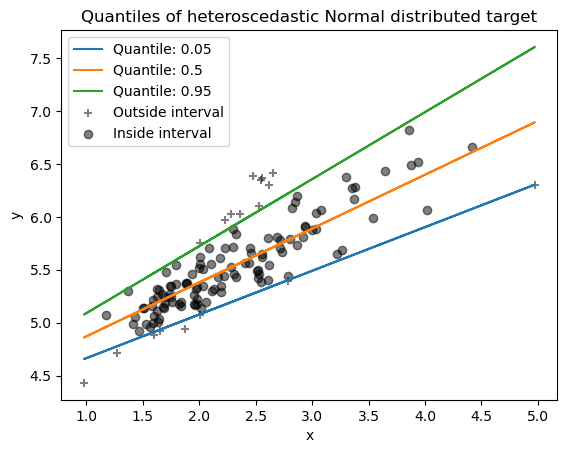

In [96]:
for quantile, y_pred in predictions.items():
    plt.plot(X_test, y_pred, label=f"Quantile: {quantile}")

plt.scatter(
    X_test[out_bounds_predictions_test],
    y_test[out_bounds_predictions_test],
    color="black",
    marker="+",
    alpha=0.5,
    label="Outside interval",
)
plt.scatter(
    X_test[~out_bounds_predictions_test],
    y_test[~out_bounds_predictions_test],
    color="black",
    alpha=0.5,
    label="Inside interval",
)

plt.legend()
plt.xlabel("x")
plt.ylabel("y")
_ = plt.title("Quantiles of heteroscedastic Normal distributed target")


Почитать: https://www3.nd.edu/~rwilliam/stats2/l25.pdf

**Задание**: Постройте модели, учитывающие гетероскедастичность  для  Anscombe 3 и 4. Предложите сами, как вы будете задавать веса.
- Anscombe 3: Веса представим как обратную дисперсии, пропорциональной x 
- Anscombe 4: Веса представим как обратно пропорциональные остаткам

In [142]:
from sklearn.linear_model import LinearRegression, QuantileRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
import pandas as pd

# Anscombe 3
x3 = np.array(quartet_df['x123']).reshape((-1, 1))
y3 = np.array(quartet_df['y3'])

# Обычная регрессия
model_3 = LinearRegression().fit(x3, y3)
y_pred3 = model_3.predict(x3)
r_sq3 = model_3.score(x3, y3)
mae3 = mean_absolute_error(y3, y_pred3)
mse3 = mean_squared_error(y3, y_pred3)
residuals3 = np.abs(y3 - y_pred3)

weights3 = 1 / (np.sqrt(x3.flatten()) + 1e-5)

# Взвешенная регрессия
model_3_wls = LinearRegression().fit(x3, y3, sample_weight=weights3)
y_pred3_wls = model_3_wls.predict(x3)
r_sq3_wls = model_3_wls.score(x3, y3)
mae3_wls = mean_absolute_error(y3, y_pred3_wls)
mse3_wls = mean_squared_error(y3, y_pred3_wls)


# Квантильные регрессии для Anscombe 3
quantile_regressor_3_05 = QuantileRegressor(quantile=0.05).fit(x3, y3)
y_pred3_quantile_05 = quantile_regressor_3_05.predict(x3)
mae3_quantile_05 = mean_absolute_error(y3, y_pred3_quantile_05)
mse3_quantile_05 = mean_squared_error(y3, y_pred3_quantile_05)

quantile_regressor_3_50 = QuantileRegressor(quantile=0.5).fit(x3, y3)
y_pred3_quantile_50 = quantile_regressor_3_50.predict(x3)
mae3_quantile_50 = mean_absolute_error(y3, y_pred3_quantile_50)
mse3_quantile_50 = mean_squared_error(y3, y_pred3_quantile_50)

quantile_regressor_3_95 = QuantileRegressor(quantile=0.95).fit(x3, y3)
y_pred3_quantile_95 = quantile_regressor_3_95.predict(x3)
mae3_quantile_95 = mean_absolute_error(y3, y_pred3_quantile_95)
mse3_quantile_95 = mean_squared_error(y3, y_pred3_quantile_95)

# Anscombe 4
x4 = np.array(quartet_df['x4']).reshape((-1, 1))
y4 = np.array(quartet_df['y4'])

# Обычная регрессия
model_4 = LinearRegression().fit(x4, y4)
y_pred4 = model_4.predict(x4)
r_sq4 = model_4.score(x4, y4)
mae4 = mean_absolute_error(y4, y_pred4)
mse4 = mean_squared_error(y4, y_pred4)
residuals4 = np.abs(y4 - y_pred4)

weights4 = 1 / (residuals4**2 + 1e-5)

# Взвешенная регрессия
model_4_wls = LinearRegression().fit(x4, y4, sample_weight=weights4)
y_pred4_wls = model_4_wls.predict(x4)
r_sq4_wls = model_4_wls.score(x4, y4)
mae4_wls = mean_absolute_error(y4, y_pred4_wls)
mse4_wls = mean_squared_error(y4, y_pred4_wls)

# Квантильные регрессии для Anscombe 4
quantile_regressor_4_05 = QuantileRegressor(quantile=0.05).fit(x4, y4)
y_pred4_quantile_05 = quantile_regressor_4_05.predict(x4)
mae4_quantile_05 = mean_absolute_error(y4, y_pred4_quantile_05)
mse4_quantile_05 = mean_squared_error(y4, y_pred4_quantile_05)

quantile_regressor_4_50 = QuantileRegressor(quantile=0.5).fit(x4, y4)
y_pred4_quantile_50 = quantile_regressor_4_50.predict(x4)
mae4_quantile_50 = mean_absolute_error(y4, y_pred4_quantile_50)
mse4_quantile_50 = mean_squared_error(y4, y_pred4_quantile_50)

quantile_regressor_4_95 = QuantileRegressor(quantile=0.95).fit(x4, y4)
y_pred4_quantile_95 = quantile_regressor_4_95.predict(x4)
mae4_quantile_95 = mean_absolute_error(y4, y_pred4_quantile_95)
mse4_quantile_95 = mean_squared_error(y4, y_pred4_quantile_95)

# Формируем DataFrame для вывода
results = pd.DataFrame(
    {
        "Model": [
            "Anscombe 3", "(WLS) Anscombe 3", "(Quantile 0.05) Anscombe 3", "(Quantile 0.5) Anscombe 3", "(Quantile 0.95) Anscombe 3",
            "Anscombe 4", "(WLS) Anscombe 4", "(Quantile 0.05) Anscombe 4", "(Quantile 0.5) Anscombe 4", "(Quantile 0.95) Anscombe 4"
        ],
        "MSE": [
            mse3, mse3_wls, mse3_quantile_05, mse3_quantile_50, mse3_quantile_95,
            mse4, mse4_wls, mse4_quantile_05, mse4_quantile_50, mse4_quantile_95
        ],
        "MAE": [
            mae3, mae3_wls, mae3_quantile_05, mae3_quantile_50, mae3_quantile_95,
            mae4, mae4_wls, mae4_quantile_05, mae4_quantile_50, mae4_quantile_95
        ],
        "R²": [
            r_sq3, r_sq3_wls, np.nan, np.nan, np.nan,  # R² для квантильной регрессии не имеет смысла
            r_sq4, r_sq4_wls, np.nan, np.nan, np.nan   # R² для квантильной регрессии не имеет смысла
        ],
    }
)

# Выводим в виде таблицы
print(results.to_string(index=False))

                     Model       MSE      MAE       R²
                Anscombe 3  1.250563 0.715967 0.666324
          (WLS) Anscombe 3  1.252781 0.695614 0.665732
(Quantile 0.05) Anscombe 3  8.199936 2.110000      NaN
 (Quantile 0.5) Anscombe 3  1.638193 0.387727      NaN
(Quantile 0.95) Anscombe 3 31.205436 5.240000      NaN
                Anscombe 4  1.249317 0.902727 0.666707
          (WLS) Anscombe 4  1.249724 0.902727 0.666599
(Quantile 0.05) Anscombe 4  8.815000 2.250909      NaN
 (Quantile 0.5) Anscombe 4  3.960845 1.399091      NaN
(Quantile 0.95) Anscombe 4 28.739318 4.999091      NaN


- В случае Anscombe 4 веса почти не влияют на результат.
- В случае же Anscombe 3 удалось снизить MAE с помощью корректировки весов.

**Задание**: Постройте синтетические данные, подходящие для линейной модели. Покажите, поможет ли использование QuantileRegressor для удаления выбросов получить лучшую модель и для каких видов гетероскедастичности (выбросы, распределение, "форма" шума)

Данные с выбросами:
 OLS: коэффициент = 2.85, пересечение = 3.07, RMSE = 2.65
 QuantileRegressor: коэффициент = 2.96, пересечение = 2.39, RMSE = 2.67



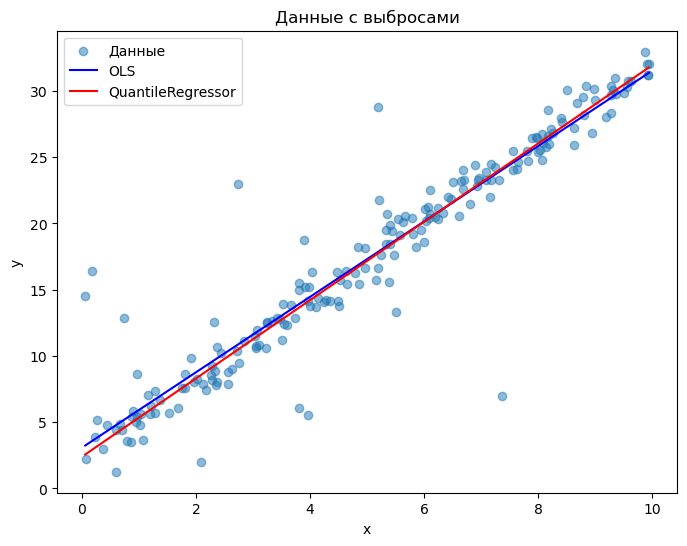

Гетероскедастичность: увеличение дисперсии с x (по распределению):
 OLS: коэффициент = 3.02, пересечение = 1.92, RMSE = 3.91
 QuantileRegressor: коэффициент = 3.08, пересечение = 1.60, RMSE = 3.92



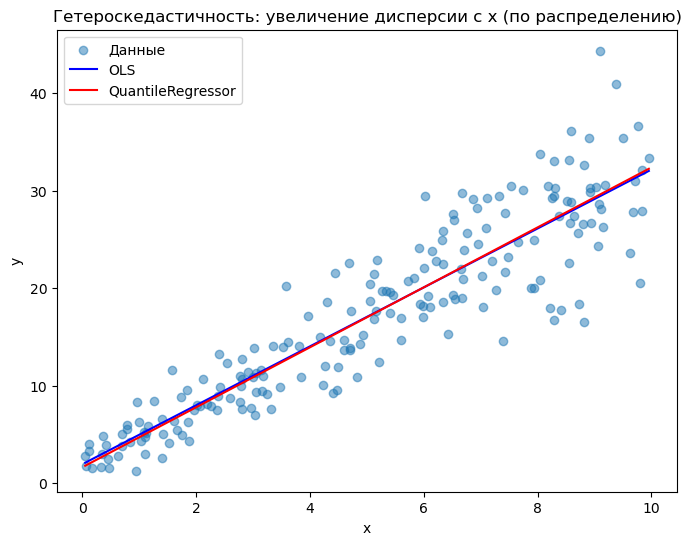

Гетероскедастичность: тяжёлые хвосты в распределении шума:
 OLS: коэффициент = 3.03, пересечение = 1.92, RMSE = 1.64
 QuantileRegressor: коэффициент = 3.00, пересечение = 2.01, RMSE = 1.64



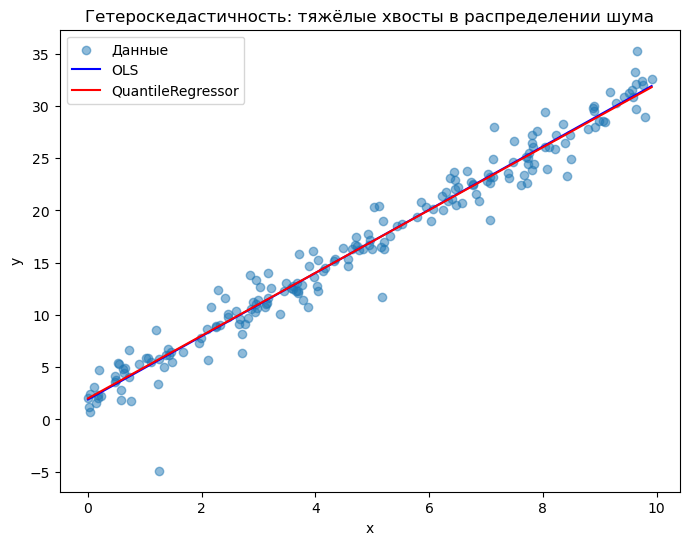

In [146]:
def generate_data_outliers(n=200):
    x = np.random.uniform(0, 10, n)
    # Базовая модель: y = 2 + 3*x с нормальным шумом
    y = 2 + 3*x + np.random.normal(0, 1, n)
    # У точек бывает шум с большой дисперсией
    n_outliers = int(0.1 * n)
    outlier_indices = np.random.choice(n, n_outliers, replace=False)
    y[outlier_indices] += np.random.normal(0, 10, n_outliers)
    return x, y

#  Генерации данных с увеличивающейся дисперсией
def generate_data_heteroscedastic(n=200):
    x = np.random.uniform(0, 10, n)
    # Дисперсия шума растёт с x (sigma = 1 + 0.5*x)
    y = 2 + 3*x + np.random.normal(0, 1 + 0.5*x, n)
    return x, y

# Генерации данных с тяжёлым распределением шума
def generate_data_heavy_tailed(n=200):
    x = np.random.uniform(0, 10, n)
    # Распределение Лапласа
    y = 2 + 3*x + np.random.laplace(0, 1, n)
    return x, y

def fit_models(x, y, title=''):
    x = x.reshape(-1, 1)
    # Линейная регрессия
    model_ols = LinearRegression().fit(x, y)
    # Медианная регрессия, quantile=0.5
    model_qr = QuantileRegressor(quantile=0.5, alpha=0).fit(x, y)
    
    y_pred_ols = model_ols.predict(x)
    y_pred_qr = model_qr.predict(x)
    rmse_ols = np.sqrt(np.mean((y - y_pred_ols)**2))
    rmse_qr = np.sqrt(np.mean((y - y_pred_qr)**2))
    
    print(f"{title}:")
    print(f" OLS: коэффициент = {model_ols.coef_[0]:.2f}, пересечение = {model_ols.intercept_:.2f}, RMSE = {rmse_ols:.2f}")
    print(f" QuantileRegressor: коэффициент = {model_qr.coef_[0]:.2f}, пересечение = {model_qr.intercept_:.2f}, RMSE = {rmse_qr:.2f}\n")
    
    plt.figure(figsize=(8,6))
    plt.scatter(x, y, alpha=0.5, label='Данные')
    x_line = np.linspace(x.min(), x.max(), 100).reshape(-1, 1)
    plt.plot(x_line, model_ols.predict(x_line), color='blue', label='OLS')
    plt.plot(x_line, model_qr.predict(x_line), color='red', label='QuantileRegressor')
    plt.title(title)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.legend()
    plt.show()

x_out, y_out = generate_data_outliers()
fit_models(x_out, y_out, 'Данные с выбросами')

x_het, y_het = generate_data_heteroscedastic()
fit_models(x_het, y_het, 'Гетероскедастичность: увеличение дисперсии с x (по распределению)')

x_ht, y_ht = generate_data_heavy_tailed()
fit_models(x_ht, y_ht, 'Гетероскедастичность: тяжёлые хвосты в распределении шума')

#### Выбросы
Квантильная(медианная) регрессия менее чувствителена к экстремальным значениям. В случае выбросов его оценка будет точнее чем у OLS, который сильно смещается в случае выбросов.
#### Распределение
В случае распредеения оценка квантильной регрессии будет чуть точнее чем у OLS, так как и среднее значение и медиана зависят от изменения дисперсии.
#### Формой шума (тяжелые хвосты)
В случае распредеения оценка квантильной регрессии будет более устойчива к шуму чем у OLS, так как и медиана меньше подвержена влииянию выбросов чем среднее значение.

## Мультиколлинеарность

Мультиколлинеарность представляет собой проблему, поскольку она дает менее надежные результаты регрессионной модели. Это связано с более широкими доверительными интервалами (большими стандартными ошибками), которые могут снизить статистическую значимость коэффициентов регрессии. При анализе данных это может привести к ложным впечатлениям.

Рассмотрим уже знакомый нам набор данных, посвященный недвижимости.

In [149]:
data = pd.read_csv(f"{data_path}/realestate.txt", sep="\t")

In [150]:
data["SalePrice"] = np.log(data["SalePrice"])
data.describe()

,SalePrice,SqFeet,Beds,Baths,Air,Garage,Pool,Year,Quality,Style,Lot,Highway
count,521.000000,521.000000,521.000000,521.000000,521.000000,521.000000,521.000000,521.000000,521.000000,521.000000,521.000000,521.000000
mean,5.525443,2.260879,3.477927,2.646833,0.831094,2.097889,0.069098,1966.856046,2.186180,3.349328,24.344668,0.021113
std,0.430851,0.711726,1.003835,1.058861,0.375029,0.653405,0.253864,17.620476,0.639923,2.563209,11.681280,0.143900
min,4.430817,0.980000,1.000000,1.000000,0.000000,0.000000,0.000000,1885.000000,1.000000,1.000000,4.560000,0.000000
25%,5.192957,1.701000,3.000000,2.000000,1.000000,2.000000,0.000000,1956.000000,2.000000,1.000000,17.159000,0.000000
50%,5.437644,2.061000,3.000000,3.000000,1.000000,2.000000,0.000000,1966.000000,2.000000,2.000000,22.196000,0.000000
75%,5.814131,2.638000,4.000000,3.000000,1.000000,2.000000,0.000000,1981.000000,3.000000,7.000000,26.777000,0.000000
max,6.824374,5.032000,7.000000,7.000000,1.000000,7.000000,1.000000,1998.000000,3.000000,11.000000,86.830000,1.000000


Обучим базовую модель на одном признаке.

In [151]:
model = LinearRegression()
x_train, x_test, y_train, y_test = train_test_split(data[["SqFeet"]], data["SalePrice"], random_state=42)
model.fit(x_train, y_train)
print(f"Model score is: {model.score(x_test, y_test)}")
print(f"Coefficients are: {model.coef_}")

Model score is: 0.696237587585443
Coefficients are: [0.50970481]


Теперь добавим несколько видов мультиколлинеарности в данных.

### Совершенная коллинеарность

Если две или более независимых переменных имеют между собой линейную связь, то
у нас получается идеальная мультиколлинеарность.
Примеры: включение одной и той же информации дважды (стоимость в рублях и долларах), неправильное использование фиктивных переменных (dummy variables trap) и т. д.
Вот пример идеальной мультиколлинеарности в модели с двумя объясняющими
переменными:
\begin{equation}
y = α_{1} X_1 + \alpha_{2} X_2
\end{equation}
\begin{equation}
X_1 = \beta_1 X_2 + \beta_2
\end{equation}


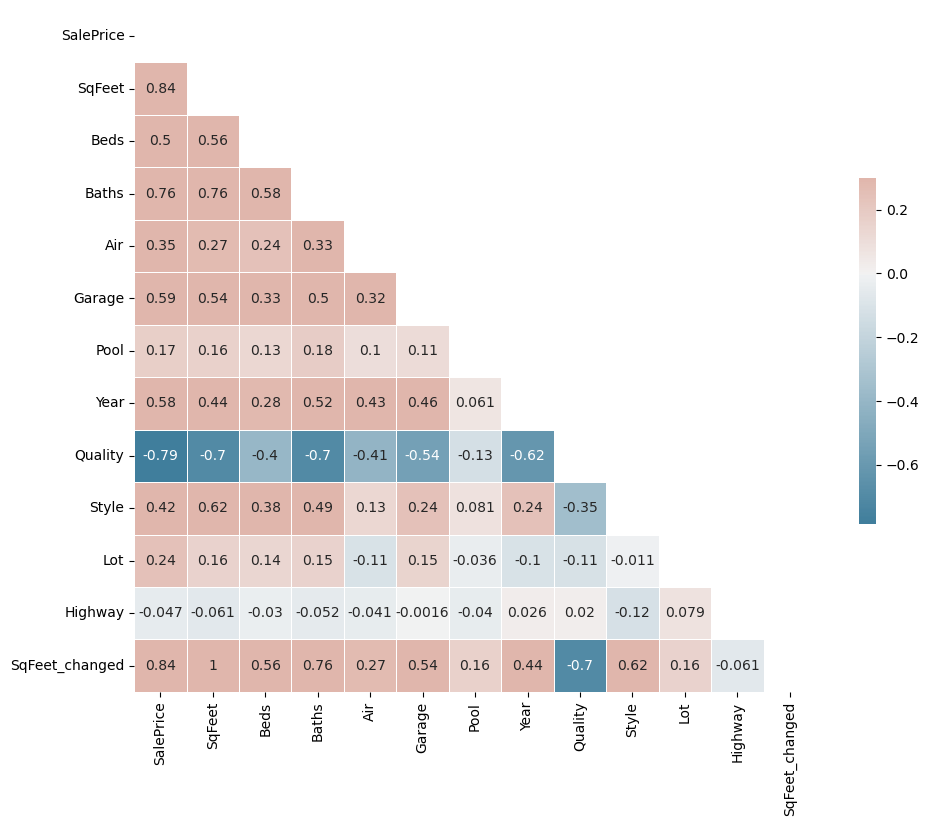

In [152]:
data["SqFeet_changed"] = data["SqFeet"]* 0.8 + 10
corrplot(data)

In [153]:
model = LinearRegression()
x_train, x_test, y_train, y_test = train_test_split(data[["SqFeet_changed", "SqFeet"]], data["SalePrice"], random_state=42)
model.fit(x_train, y_train)
model.score(x_test, y_test)
print(f"Model score is: {model.score(x_test, y_test)}")
print(f"Coefficients are: {model.coef_}")

Model score is: 0.6962375875854426
Coefficients are: [0.24863649 0.31079562]


In [154]:
data["SqFeet_changed_2"] = data["SqFeet"]* 0.5 - 10
model = LinearRegression()
x_train, x_test, y_train, y_test = train_test_split(data[["SqFeet_changed", "SqFeet_changed_2", "SqFeet"]], data["SalePrice"], random_state=42)
model.fit(x_train, y_train)
model.score(x_test, y_test)
print(f"Model score is: {model.score(x_test, y_test)}")
print(f"Coefficients are: {model.coef_}")

Model score is: 0.6962375875854426
Coefficients are: [0.21574807 0.13484254 0.26968508]


По идее, совершенная коллинеарность не дает в принципе построить линейную модель, так как невозможно оценить маржинальный эффект воздействия признака на целевую переменную, сохраняя остальные константными.
)
На практике же, даже если конкретная реализация OLS позволит построить коэффициенты, это ведет к тому, что модель перестает быть устойчивой.

### Несовершенная мультиколлинеарность
Несовершенная мультиколлинеарность не нарушает базовых предположений ЛР. Следовательно, теорема Гаусса-Маркова говорит нам, что оценки МНК состоятельны.

Так почему же нас волнует мультиколлинеарность?
2. Дисперсия и стандартные ошибки оценок коэффициентов регрессии будут
увеличиваться. Это означает более низкую t-статистику.
3. На общую точность уравнения регрессии мультиколлинеарность практически не повлияет.
4. Коэффициенты регрессии будут сильно зависеть от признаков. Таким образом, коэффициенты существенно измениться при добавлении или удалении переменных.

In [155]:
data["SqFeet_changed"] = data["SqFeet"] * 0.8 - 20
data["SqFeet_changed_2"] = data["SqFeet_changed"] * 1.5 + 10

data["SqFeet_changed"] += np.random.normal(+1, 0.5, len(data["SqFeet_changed"]))
data["SqFeet_changed_2"] += np.random.normal(-1, 0.5, len(data["SqFeet_changed"]))


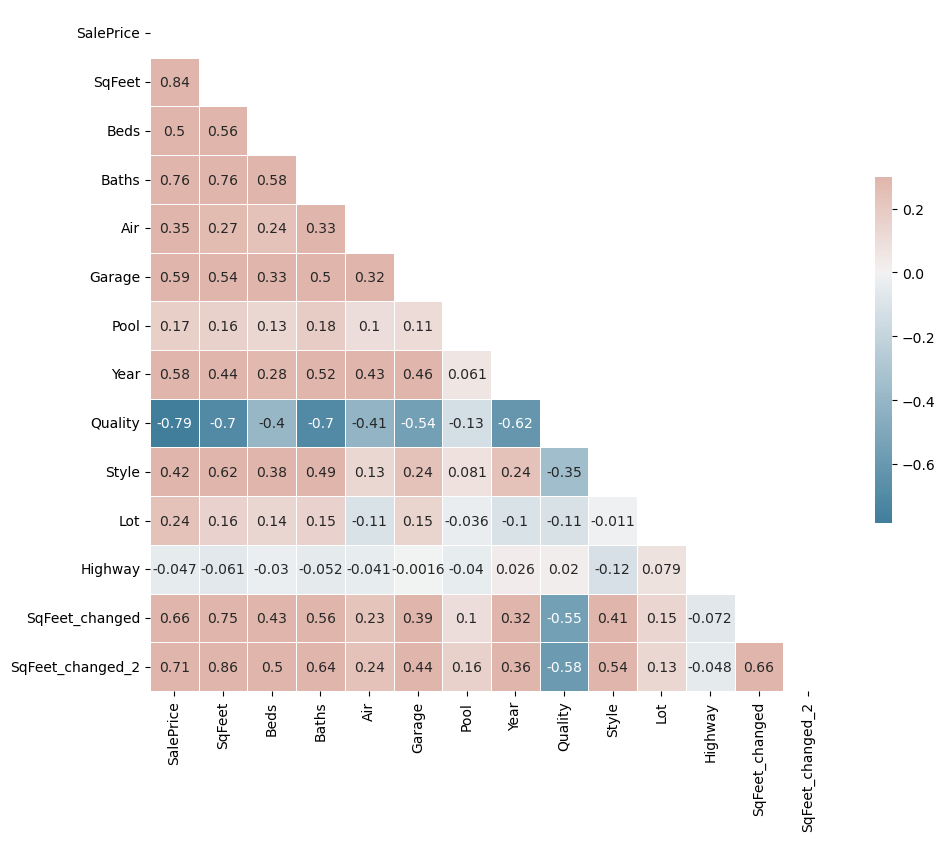

In [156]:
corrplot(data)

In [157]:
model = LinearRegression()
x_train, x_test, y_train, y_test = train_test_split(data[["SqFeet_changed", "SqFeet_changed_2", "SqFeet"]], data["SalePrice"], random_state=42)
model.fit(x_train, y_train)
model.score(x_test, y_test)
print(f"Model score is: {model.score(x_test, y_test)}")
print(f"Coefficients are: {model.coef_}")

Model score is: 0.6992873758922584
Coefficients are: [ 0.02592418 -0.0291732   0.52381743]


In [158]:
model = LinearRegression()
x_train, x_test, y_train, y_test = train_test_split(data[["SqFeet_changed", "SqFeet"]], data["SalePrice"], random_state=42)
model.fit(x_train, y_train)
model.score(x_test, y_test)
print(f"Model score is: {model.score(x_test, y_test)}")
print(f"Coefficients are: {model.coef_}")

Model score is: 0.6973606739542064
Coefficients are: [0.02666359 0.48775615]


Как видно, только один признак имеет большой вес, точность при этом практически не меняется. Однако значимость многих признаков становится неудовлетворительной. Поэтому, если оценить значимость коэффициентов модели, можно обнаружить, что многие признаки просто не нужны. При этом получается, что даже при очень небольшом изменении модели мы можем сделать совершенно противоположные выводы о том, какие признаки важны.

Итак, первый способ найти коллинеарные признаки - оценить значимость коэффициентов (t-statistic + p-value)

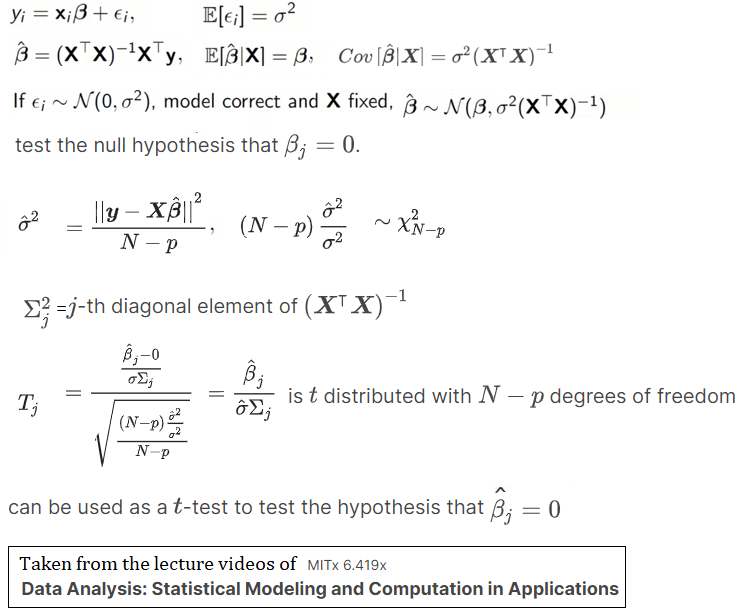

In [159]:
from scipy.stats import t

In [167]:
def get_p_values(model, x: pd.DataFrame, y: pd.DataFrame, a: int = 0.01) -> None:
  beta_hat = [model.intercept_] + model.coef_.tolist()
  n = len(x)
  print(f"Coeffficents: {beta_hat}")
  x_1 = np.column_stack((np.ones(n), x))
  # standard deviation of the noise.
  residuals = y - model.predict(x)
  sigma_hat = np.sqrt(np.sum(residuals**2) / (n-x_1.shape[1]))  # Стандартное отклонение ошибок
    
  # estimate the covariance matrix for beta
  xtx_inv = np.linalg.inv(np.dot(x_1.T, x_1))  # (X^T * X)^-1
  beta_cov = sigma_hat**2 * xtx_inv
  
  # the t-test statistic for each variable from the formula from above figure
  t_vals = beta_hat / (sigma_hat * np.sqrt(np.diagonal(beta_cov)))
  # compute 2-sided p-values.
  p_vals = t.sf(np.abs(t_vals), n-x_1.shape[1])*2
  print(f"T values: {t_vals}")
  print(f"p-values: {p_vals}")
  print(f"Is valuable: {p_vals > 0.01}")

In [168]:
get_p_values(model, x_test, y_test)

Coeffficents: [np.float64(-1.8869862948606455), 0.3212868603409218, 0.017466610145077586, 0.05093416135271121, 0.006897654200606542, 0.037802313603587115, 0.03515140557374269, 0.0033515025499284007, -0.11809948067100356, -0.01708504305891824, 0.004872320182991095, -0.06529713093140785]
T values: [ -3.015575    33.31487034   3.70977038   7.75781867   0.56002731
   4.54943432   2.58059752  10.56540175 -12.24281052  -8.70485416
  13.3081557   -1.53067791]
p-values: [3.13624304e-03 3.58265497e-62 3.16697343e-04 3.28933039e-12
 5.76513524e-01 1.30493487e-05 1.10779377e-02 8.29635496e-19
 8.37625477e-23 2.14129949e-14 2.60812513e-25 1.28503074e-01]
Is valuable: [False False False False  True False  True False False False False  True]


Мультиколлинеарность можно обнаружить и с помощью коэффициента инфляции дисперсии (VIF). Для каждого признака в построенной модели этот коэффициент покащзывает, в какой степени коэфициент "испорчен" коллинеарностью с другими признаками.

В методе VIF мы выбираем каждый признак и сравниваем его со всеми другими признаками. Для каждого признака коэффициент рассчитывается как:

image.png
где R-квадрат — коэффициент детерминации в линейной регрессии этого признака, построенной по всем остальным признакам (1-to-all). Его значение лежит между 0 и 1.
Как мы видим из формулы, чем больше значение R-квадрат, тем больше VIF. Следовательно, больший VIF означает большую корреляцию. Это согласуется с тем фактом, что более высокое значение R-квадрат означает более сильную коллинеарность. Обычно значение VIF выше 5 указывает на высокую мультиколлинеарность.


In [172]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming x_train is your input features dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = x_train.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(x_train.values, i) for i in range(len(x_train.columns))]

print(vif_data)

    feature         VIF
0    SqFeet   44.314842
1      Beds   21.771159
2     Baths   21.310745
3       Air    7.332373
4    Garage   17.244375
5      Pool    1.114873
6      Year  121.269750
7   Quality   33.782352
8     Style    4.639236
9       Lot    5.769237
10  Highway    1.060519


Как мы видим, наши переменные имеют очень высокие значения VIF, что означает сильную коллинеарность между ними.


In [173]:
features = ['SqFeet', 'Beds', 'Baths', 'Air', 'Garage', 'Pool', 'Year',
       'Quality', 'Style', 'Lot', 'Highway']

In [174]:
model = LinearRegression()
x_train, x_test, y_train, y_test = train_test_split(data[features], data["SalePrice"], random_state=42)
model.fit(x_train, y_train)
model.score(x_test, y_test)
print(f"Model score is: {model.score(x_test, y_test)}")
print(f"Coefficients are: {model.coef_}")

Model score is: 0.8333627167756654
Coefficients are: [ 0.32128686  0.01746661  0.05093416  0.00689765  0.03780231  0.03515141
  0.0033515  -0.11809948 -0.01708504  0.00487232 -0.06529713]


In [176]:
vif_data = pd.DataFrame()
vif_data["feature"] = x_train.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(x_train.values, i) for i in range(len(x_train.columns))]
vif_data

,feature,VIF
0,SqFeet,44.314842
1,Beds,21.771159
2,Baths,21.310745
3,Air,7.332373
4,Garage,17.244375
5,Pool,1.114873
6,Year,121.269750
7,Quality,33.782352
8,Style,4.639236
9,Lot,5.769237


Теперь можно удалить некоторые признаки. Для этого используются разные способы feature selection. Посмотрим, узменится ли предсказание при удалении некоторых признаков

**Задание**: Постройте модель, удалив лишние признаки. Можно ли получить модель с лучшим скором?

In [193]:
# Удаление признаков с высоким VIF
high_vif_features = ['Beds', 'Baths']
x_train_reduced = x_train.drop(columns=high_vif_features)
x_test_reduced = x_test.drop(columns=high_vif_features)

# Обучение модели с оставшимися признаками
model_reduced = LinearRegression()
model_reduced.fit(x_train_reduced, y_train)

# Оценка модели
score_reduced = model_reduced.score(x_test_reduced, y_test)
print(f"New model score is: {score_reduced}")

New model score is: 0.8472695564198967


- VIF просто позволяет лучше понять какие признаки являются более важными чем остальные. Если пользоваться выводами который он дает неаккуратно можно потерять часть важной информации влияющей на итоговый результат. Если попробывать удалить все признаки у которых VIF > 10 мы получим скор = 0.27...
- Поэтому стоит внимательно подойти к выбору признаков для удаления так была выбрана комбинация признаков с высоким VIF и удалось подобрать такие признаки чтобы увеличить скор.